In [1]:
# Run if using on google collab, change path accordingly
from google.colab import drive # type: ignore
drive.mount('/content/drive', force_remount=True)
path = '/content/drive/MyDrive/Colab Notebooks/ML - LGI/Project_Unsupervised/'

ModuleNotFoundError: No module named 'google'

In [2]:
# run if running locally
path = ''

In [3]:
!pip install git+https://github.com/sevamoo/SOMPY.git #egg=SOMPY
!pip install scikit-image

  Cloning https://github.com/sevamoo/SOMPY.git to /tmp/pip-req-build-w5zzvqt1
  Running command git clone --filter=blob:none --quiet https://github.com/sevamoo/SOMPY.git /tmp/pip-req-build-w5zzvqt1
  Resolved https://github.com/sevamoo/SOMPY.git to commit 6aca604b06e5eea1391ecf507810c7aabafc3f8b
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import multiprocessing
import sompy
from sompy.sompy import SOMFactory

cpuc = multiprocessing.cpu_count()-1

#setting seaborn visual style in plt
sns.set_theme()

In [7]:
from tqdm import tqdm

# Integration & Exploration

In [8]:
# dataDF: pd.DataFrame = pd.read_excel(path + 'data/Descriptive_Data.xlsx')
# print(f"Duplicaded: {dataDF.duplicated().sum()}\nMissing: {dataDF.isna().sum().sum()}\nNon-Registered (empty): {(dataDF["Registered"] != "Yes").sum()}")

In [10]:
# import the data and drop remove useless stuff
dataDF: pd.DataFrame = pd.read_excel(path + 'data/Descriptive_Data.xlsx')
dataDF: pd.DataFrame = dataDF.set_index('Userid')
dfSuccess: pd.DataFrame = pd.read_excel(path+'data/Descriptive_Data.xlsx',sheet_name=2)
dfSuccess = dfSuccess.set_index('Userid')
dataDF = dataDF.join(dfSuccess, 'Userid')
dataDF = dataDF.drop('Observations', axis=1).drop_duplicates()
dataDF = dataDF[dataDF['Registered'] == 'Yes']
dataDF = dataDF.drop('Registered', axis=1)

In [11]:
metricFeatures: list[str] = ['Application order','Previous qualification score','Entry score','Age at enrollment','N units credited 1st period',
       'N units taken 1st period', 'N scored units 1st period',
       'N units approved 1st period', 'Average grade 1st period',
       'N unscored units 1st period', 'N units credited 2nd period',
       'N units taken 2nd period', 'N scored units 2nd period',
       'N units approved 2nd period', 'Average grade 2nd period',
       'N unscored units 2nd period','Social Popularity']
categoricalFeatures: list[str] =  ['Application mode','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation']
boolFeatures: list[str] = ['Morning shift participation','Displaced','Special needs','Debtor','Regularized Fees','Gender_Male','External Funding','International']

academicFeatures: list[str] = ['Previous qualification score','Entry score','N units taken 1st period', 'N scored units 1st period',
       'N units approved 1st period', 'Average grade 1st period',
       'N unscored units 1st period', 'N units credited 2nd period',
       'N units taken 2nd period', 'N scored units 2nd period',
       'N units approved 2nd period', 'Average grade 2nd period',
       'N unscored units 2nd period']
demographicFeatures: list[str] = ['Age at enrollment','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation','Special needs','International','Debtor','Regularized Fees','Gender_Male']

In [12]:
dataDF[metricFeatures].describe()

,Application order,Previous qualification score,Entry score,Age at enrollment,N units credited 1st period,N units taken 1st period,N scored units 1st period,N units approved 1st period,Average grade 1st period,N unscored units 1st period,N units credited 2nd period,N units taken 2nd period,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,Social Popularity
count,4336.000000,4424.000000,4424.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.000000,4424.000000,4336.00000,4336.000000,4336.000000,4336.000000,4336.000000,4424.000000,4336.00000,4424.000000
mean,1.727168,132.613314,126.978119,23.271679,0.711255,6.264991,8.297048,4.711716,10.640822,0.13953,0.547279,6.226937,8.060655,4.431734,10.230206,0.15060,49.416139
std,1.317108,13.188332,14.482001,7.593933,2.367723,2.477978,4.181946,3.101945,4.843663,0.69710,1.931605,2.197235,3.942173,2.996183,5.210808,0.75341,28.605659
min,0.000000,95.000000,95.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000
25%,1.000000,125.000000,117.900000,19.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.00000,0.000000,5.000000,6.000000,2.000000,10.750000,0.00000,25.000000
50%,1.000000,133.100000,126.100000,20.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.00000,0.000000,6.000000,8.000000,5.000000,12.200000,0.00000,49.000000
75%,2.000000,140.000000,134.800000,25.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.00000,0.000000,7.000000,10.000000,6.000000,13.333333,0.00000,74.000000
max,9.000000,190.000000,190.000000,70.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.00000,19.000000,23.000000,33.000000,20.000000,18.571429,12.00000,99.000000


In [13]:
for variable in categoricalFeatures:
  print(dataDF[variable].value_counts())

Application mode
1.0    1725
0.0    1640
2.0     850
3.0     121
Name: count, dtype: int64
Marital status
single               3919
married               379
divorced               91
facto union            25
legally separated       6
widower                 4
Name: count, dtype: int64
Course
Nursing                                 766
Management                              380
Social Service                          355
Veterinary Nursing                      337
Journalism and Communication            331
Management (evening attendance)         268
Advertising and Marketing Management    268
Tourism                                 252
Communication Design                    226
Animation and Multimedia Design         215
Social Service (evening attendance)     215
Agronomy                                210
Basic Education                         192
Informatics Engineering                 170
Equinculture                            141
Oral Hygiene                             86
B

Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='/home/oakei/Documents/GitHub/mlproj/.venv/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans-BoldOblique.ttf', name='DejaVu Sans', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 3.335
findfont: score(FontEntry(fname='/home/oakei/Documents/GitHub/mlproj/.venv/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/cmex10.ttf', name='cmex10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/home/oakei/Documents/GitHub/mlproj/.venv/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=400, s

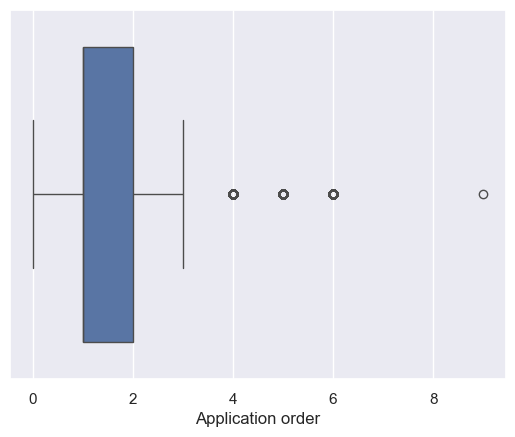

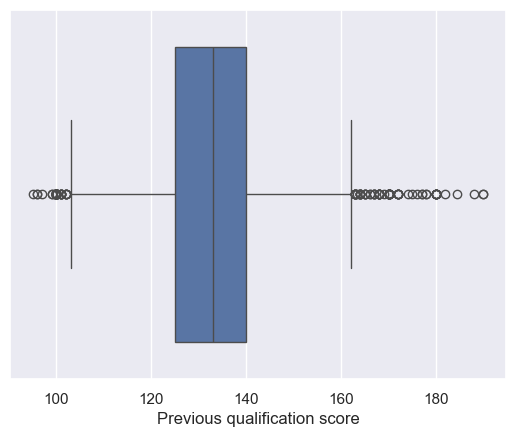

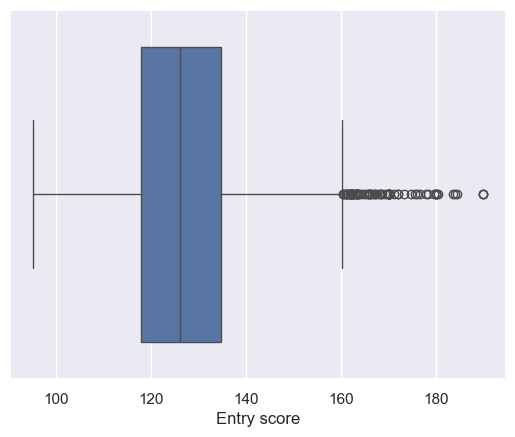

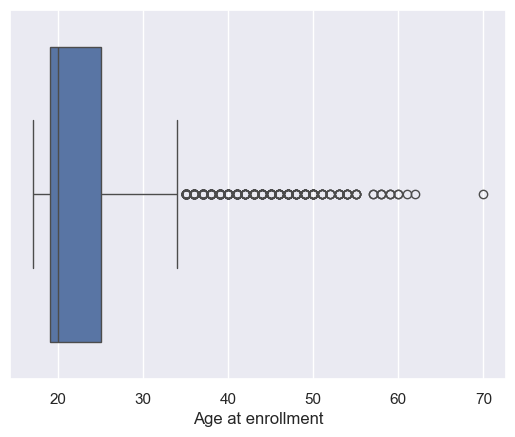

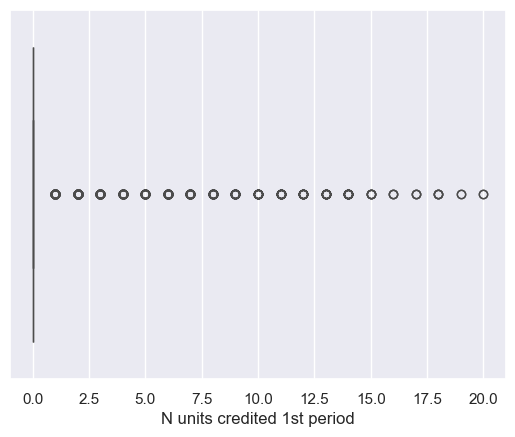

...

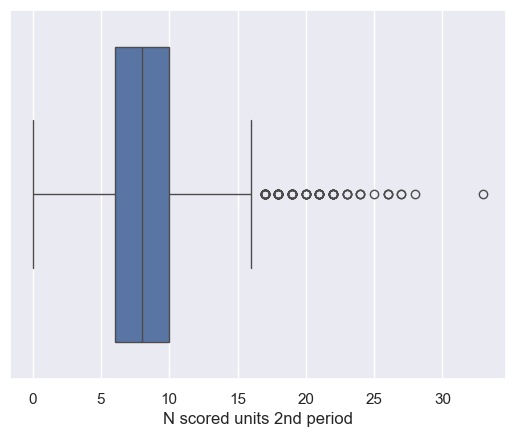

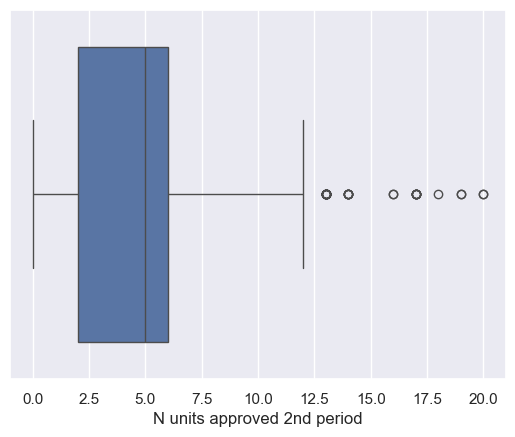

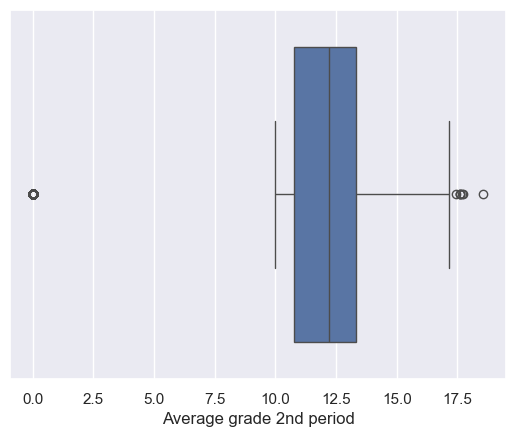

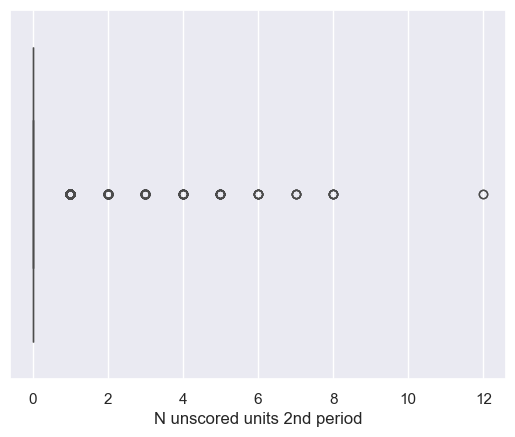

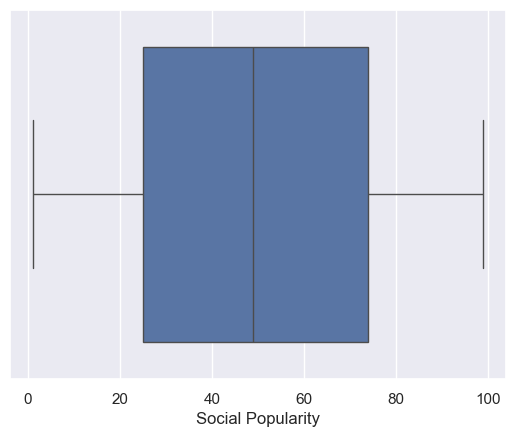

In [14]:
for i, col in enumerate(metricFeatures):
  plt.figure(i)
  sns.boxplot(x=col, data=dataDF)

In [15]:
# mn.matrix(data)

In [16]:
# percentage of empty values in a column
round(dataDF.isnull().sum() / dataDF.shape[0] * 100.00,2)

Marital status                  0.00
Application mode                1.99
Application order               1.99
Course                          0.00
Morning shift participation     1.99
Previous qualification          0.05
Previous qualification score    0.00
Nationality                     0.00
Mother's qualification          2.94
Father's qualification          2.62
Mother's occupation             0.38
Father's occupation             1.20
Entry score                     0.00
Displaced                       1.99
Special needs                   1.99
Debtor                          1.99
Regularized Fees                1.99
Gender_Male                     1.99
External Funding                1.99
Age at enrollment               1.99
International                   1.99
N units credited 1st period     1.99
N units taken 1st period        1.99
N scored units 1st period       1.99
N units approved 1st period     1.99
Average grade 1st period        0.00
N unscored units 1st period     1.99
N

# Preprocessing

In [17]:
def fillNa(data: pd.DataFrame) -> pd.DataFrame:
    """Fill missing values

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    # on all of these features, if a value were to be different than 0, then it would not be missing, eg units approved, if the student approved, the value wouldn't be missing
    ifNaThen0: tuple[str,...] = (
        "N units credited 1st period",
        "N unscored units 1st period",
        "N scored units 1st period",
        "N units credited 2nd period",
        "N unscored units 2nd period",
        "N scored units 2nd period"
    )

    # these features are filled differently, basically incoherence checking, but filling the Na on 'N units approved 1st/2nd period' is needed beforehand, more info below
    checkAfterVars: list[list[str]] = [
        ["N units taken 1st period", "N scored units 1st period"],
        ["N units taken 2nd period", "N scored units 2nd period"]
    ]

    for var in metricFeatures:
        if var == (checkAfterVars[0][0] or checkAfterVars[1][0]):
            continue # skip current iteration
        if var in ifNaThen0:
            data[var] = data[var].fillna(0) # fill the ifNaThen0 vars with well, 0s
        else:
            data[var] = data[var].fillna(data[var].median()) # fill everything else with the median of the values of the feature

    # here we use the n units taken features we skipped earlier, a student has to have taken at least the same number of courses as the number of courses they passed
    for varList in checkAfterVars:
        # search for Na values on N units taken and replace by the equivalent value on N units approved
        data.loc[data[varList[0]].isna(), varList[0]] = data[varList[1]]
        # search for values on N units taken that are smaller than the equivalent on N units approved, replace by the equivalent value on N units approved
        data.loc[data[varList[0]] < data[varList[1]], varList[0]] = data[varList[1]]

    for var in boolFeatures:
        if var == "Regularized Fees":
            data[var] = data[var].fillna(1) # if nothing is said about the fees, we can assume they have been paid
        else:
            data[var] = data[var].fillna(0) # here is like the ifNaThen0 situation, if the values were to not be 0, they would have been declared

    return data

In [18]:
def removeOutliers(data: pd.DataFrame) -> pd.DataFrame:
    """Removes outliers and fixes any negative number incoherences on the selected variables from the dataframe

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    toBeTreated: dict[str, dict[str, float | None]] = {
        "Application order": {"lower": 0, "upper": None},
        "Previous qualification score": {"lower": 0, "upper": None},
        "Entry score": {"lower": 0, "upper": None},
        "Age at enrollment": {"lower": 0, "upper": None},
        "N units credited 1st period": {"lower": 0, "upper": 15},
        "N units taken 1st period": {"lower": 0, "upper": 20},
        "N scored units 1st period": {"lower": 0, "upper": 25},
        "N units approved 1st period": {"lower": 0, "upper": 20},
        "Average grade 1st period": {"lower": 0, "upper": None},
        "N unscored units 1st period": {"lower": 0, "upper": None},
        "N units credited 2nd period": {"lower": 0, "upper": 14},
        "N units taken 2nd period": {"lower": 0, "upper": 15},
        "N scored units 2nd period": {"lower": 0, "upper": 25},
        "N units approved 2nd period": {"lower": 0, "upper": 15},
        "Average grade 2nd period": {"lower": 0, "upper": None},
        "N unscored units 2nd period": {"lower": 0, "upper": None},
        "Social Popularity": {"lower": 0, "upper": 100},
    }

    for var in toBeTreated:
        if toBeTreated[var]["lower"] != None:
            toRemove: list = list(data.loc[data[var] < toBeTreated[var]["lower"], var].index)
        if toBeTreated[var]["upper"] != None:
            toRemove.extend(list(data.loc[data[var] > toBeTreated[var]["upper"], var].index))
        data.drop(toRemove, axis=0, inplace=True)

    return data

In [19]:
def groupValues(data: pd.DataFrame) -> pd.DataFrame:
    """replace values on columns that have lots of different values that can be grouped together to reduce the total number of dummies created after

    Args:
        data (`pd.DataFrame`): Dataframe to be treated

    Returns:
        `pd.DataFrame`: Treated dataframe
    """

    # for col in ["Mother's qualification",  "Father's qualification", "Previous qualification"]:
    #     data.replace(regex={col: {r"(?i)^no school.*$": '0',
    #                         r"(?i)^[0-4][a-z]{2} grade.*$": '1',
    #                         r"(?i)^[5-9]th grade.*$": '2',
    #                         r"(?i)^1[0-2]th grade.*$": '3',
    #                         r"(?i)^incomplete bachelor.*$": '4',
    #                         r"(?i)^bachelor degree.*$": '5',
    #                         r"(?i)^post-grad.*$": '6',
    #                         r"(?i)^master degree.*$": '7',
    #                         r"(?i)^phd.*$": '8',}}, inplace=True)
    education={
        '12th grade':'Middle',
        '9th grade':'Middle',
        '11th grade':'Middle',
        '12th grade - Technological specialization course':'Middle',
        '10th grade':'Middle',
        '12th grade - Technical-professional course':'Middle',
        '4th grade':'Lower',
        '6th grade':'Lower',
        '8th grade':'Lower',
        '3rd grade':'Lower',
        'Bachelor degree':'Higher',
        'Master degree':'Higher',
        'PhD':'Higher',
        'Post-Graduation':'Higher',
        'Incomplete Bachelor\'s':'Higher',
        'No School': 'None'
      }

    data['Father\'s qualification'].replace(education,inplace=True)
    data['Mother\'s qualification'].replace(education,inplace=True)

    for col in ["Mother's occupation", "Father's occupation"]:
          data.replace(to_replace={col: ["Superior-level Professional", "Intermediate-level Professional", "Politician/CEO", "Teacher", "Information Technology Specialist"]}, value="Professional Fields", inplace=True)
          data.replace(to_replace={col: ["Skilled construction workers", "Assembly Worker", "Factory worker", "Lab Technocian"]}, value="Technical and Skilled Trades", inplace=True)
          data.replace(to_replace={col: ["Administrative Staff", "Office worker", "Accounting operator"]}, value="White collar Jobs", inplace=True)
          data.replace(to_replace={col: ["Restaurant worker", "Personal care worker", "Seller", "Cleaning worker"]}, value="Service Industry", inplace=True)
          data.replace(to_replace={col: ["Private Security", "Armed Forces"]}, value="Security and Armed Forces", inplace=True)
          data.replace(to_replace={col: ["Unskilled Worker", "Other", "Student", "Artist"]}, value="Recreational or unskilled", inplace=True)
          data.replace(to_replace={col: ["Engineer", "Scientist", "Health professional"]}, value="STEM Jobs", inplace=True)

    data.replace(to_replace={"Marital status": {
        'single':'alone',
        'divorced':'alone',
        'legally separated':'alone',
        'widower':'alone',
        'married':'together',
        'facto union':'together'
    }}, inplace=True)

    return data

In [20]:
def getDummies(data: pd.DataFrame) -> pd.DataFrame:
    """get dummies

    Args:
        train (`pd.DataFrame`): Train dataframe to be treated

    Returns:
        `pd.DataFrame` : treated dataframe
    """

    data = pd.get_dummies(data=data, prefix_sep="-", dummy_na=True, drop_first=False)

    return data

In [21]:
def scaleData(data: pd.DataFrame) -> pd.DataFrame:
    """Tranforms the values in the dataframe to fit in a scale of 0 to 1

    Args:
        train (pd.DataFrame): Unscaled train dataframe

    Returns:
        pd.DataFrame: Scaled dataframe
    """

    scaler = MinMaxScaler()
    scaler.fit(data)

    data = pd.DataFrame(scaler.transform(data), columns = data.columns, index = data.index)

    return data

In [22]:
def encodeSuccess(successData: pd.DataFrame) -> pd.DataFrame:
    """Replace string values on success by integers

    Args:
        successData (pd.DataFrame): Untreated dataframe

    Returns:
        pd.DataFrame: Treated dataframe
    """
    successData.replace({'Success': {"Gave up": 0, "Holding on": 1, "Succeeded": 2}}, inplace=True)

    return successData

In [23]:
def prepData(data: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """Runs the preprocessing steps on the dataframe

    Args:
        data (pd.DataFrame): Un-preprocessed data dataframe

    Returns:
        pd.DataFrame: Treated dataframe
    """

    data = encodeSuccess(data)
    data = fillNa(data)
    data = removeOutliers(data)
    data = groupValues(data)
    dataAcademic: pd.DataFrame = data[academicFeatures]
    dataDemographic: pd.DataFrame = data[demographicFeatures]
    dataAcademic = getDummies(dataAcademic)
    dataDemographic = getDummies(dataDemographic)
    dataAcademic = scaleData(dataAcademic)
    dataDemographic = scaleData(dataDemographic)
    data = getDummies(data)
    data = scaleData(data)

    return data, dataAcademic, dataDemographic

# Feature Selection

In [24]:
def pairPlots(data: pd.DataFrame,fileName: str) -> None:
    sns.pairplot(data.sample(1000)).savefig(f"./output/{fileName}.png")

# Feature engineering

In [25]:
def addAverages(data):
  data['Average grades']=(data['Average grade 1st period']+data['Average grade 2nd period'])/2
  data['Average units taken']=(data['N units taken 1st period']+data['N units taken 2nd period'])/2
  data['Average scored units']=(data['N scored units 1st period']+data['N scored units 2nd period'])/2
  data['Average units approved']=(data['N units approved 1st period']+data['N units approved 2nd period'])/2
  data['Average units credited']=(data['N units credited 1st period']+data['N units credited 2nd period'])/2
  data['Average unscored units']=(data['N unscored units 1st period']+data['N unscored units 2nd period'])/2

  data['Unit load']=data['N units credited 1st period']+data['N units credited 2nd period']

In [26]:
# data['Average grades']=(data['Average grade 1st period']+data['Average grade 2nd period'])/2
# data['Average units taken']=(data['N units taken 1st period']+data['N units taken 2nd period'])/2
# data['Average scored units']=(data['N scored units 1st period']+data['N scored units 2nd period'])/2
# data['Average units approved']=(data['N units approved 1st period']+data['N units approved 2nd period'])/2
# data['Average units credited']=(data['N units credited 1st period']+data['N units credited 2nd period'])/2
# data['Average unscored units']=(data['N unscored units 1st period']+data['N unscored units 2nd period'])/2

# data['Unit load']=data['N units credited 1st period']+data['N units credited 2nd period']

In [27]:
# dataDF['Average grades']=(dataDF['Average grade 1st period']+dataDF['Average grade 2nd period'])/2
# dataDF['Average units taken']=(dataDF['N units taken 1st period']+dataDF['N units taken 2nd period'])/2
# dataDF['Average scored units']=(dataDF['N scored units 1st period']+dataDF['N scored units 2nd period'])/2
# dataDF['Average units approved']=(dataDF['N units approved 1st period']+dataDF['N units approved 2nd period'])/2
# dataDF['Average units credited']=(dataDF['N units credited 1st period']+dataDF['N units credited 2nd period'])/2
# dataDF['Average unscored units']=(dataDF['N unscored units 1st period']+dataDF['N unscored units 2nd period'])/2

# dataDF['Unit load']=dataDF['N units credited 1st period']+dataDF['N units credited 2nd period']

# Clustering

In [28]:
def getSom(data) -> tuple[sompy.sompy.SOM, int, int, np.float32]:
    """_summary_

    Args:
        data (_type_): _description_

    Returns:
        tuple[sompy.sompy.SOM, int, int, np.float32]: _description_
    """
    df_som = np.float32(data.values)
    rows = 25
    cols = 25
    mapsize: list[int] = [rows, cols]

    som: sompy.sompy.SOM = SOMFactory().build(df_som, mapsize, mask=None,
                            mapshape='planar', # 2Dimensions
                            lattice='rect', # topology: 'rect' or 'hexa'
                            normalization='var', # standardize the variables
                            initialization='pca', # initialization of the weights: 'pca' or 'random'
                            neighborhood='gaussian', # neighborhood function: 'gaussian' or 'bubble'
                            training='batch') # training mode: 'seq' or 'batch'

    return som,rows,cols,df_som

In [29]:
def getGraphs(data: pd.DataFrame, somDetails: tuple[sompy.sompy.SOM, int, int, np.float32],nClusters) -> None:
    """_summary_

    Args:
        data (pd.DataFrame): _description_
        somDetails (tuple[sompy.sompy.SOM, int, int, np.float32]): _description_
    """
    somDetails[0].train(n_job=1, verbose=None, train_rough_len=3, train_finetune_len=5)

    u = sompy.umatrix.UMatrixView(somDetails[1], height=somDetails[2], title='U-matrix', show_axis=True, text_size=8, show_text=True)

    #This is the Umat value
    UMAT  = u.build_u_matrix(somDetails[0], distance=1, row_normalized=False)

    #Here you have Umatrix plus its render
    _, umat = u.show(somDetails[0], distance=1, row_normalized=True, contour=True, blob=False)

    somDetails[0].component_names = data.columns
    comp_planes = sompy.mapview.View2DPacked(somDetails[1], somDetails[2], 'Component Planes', text_size=8)
    comp_planes.show(somDetails[0], what='codebook', which_dim='all', col_sz=8)

    cl=somDetails[0].cluster(n_clusters=nClusters)
    labels = getattr(somDetails[0], 'cluster_labels')
    h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
    h.show(somDetails[0])
    bmus = somDetails[0].project_data(somDetails[3])
    data['bmu'] = bmus
    data['label'] = labels[data['bmu']]

    # clusteringResult: pd.DataFrame = data.groupby(['label']).describe().T
    return data

In [30]:
def clustering(data: pd.DataFrame, somDetails: tuple[sompy.sompy.SOM, int, int, np.float32], nClusters: int = 4) -> pd.DataFrame:
    """_summary_

    Args:
        data (pd.DataFrame): _description_
        somDetails (tuple[sompy.sompy.SOM, int, int, np.float32]): _description_
        clusters (int, optional): _description_. Defaults to 4.
    """
    somDetails[0].cluster(n_clusters=nClusters)
    labels = getattr(somDetails[0], 'cluster_labels')
    h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
    h.show(somDetails[0])
    bmus = somDetails[0].project_data(somDetails[3])
    data['bmu'] = bmus
    data['label'] = labels[data['bmu']]

    clusteringResult: pd.DataFrame = data.groupby(['label']).describe().T

    return clusteringResult

In [31]:
def somWrap(data, getClusters: bool = True, nClusters: int = 4) -> pd.DataFrame | None:
    somDetails: tuple[sompy.sompy.SOM, int, int, np.float32] = getSom(data)
    return getGraphs(data, somDetails,nClusters)
    # if getClusters:
    #     return clustering(data, somDetails, nClusters)

/tmp/ipykernel_4423/3894077080.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  successData.replace({'Success': {"Gave up": 0, "Holding on": 1, "Succeeded": 2}}, inplace=True)
/tmp/ipykernel_4423/739561389.py:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Father\'s qualification'].repla

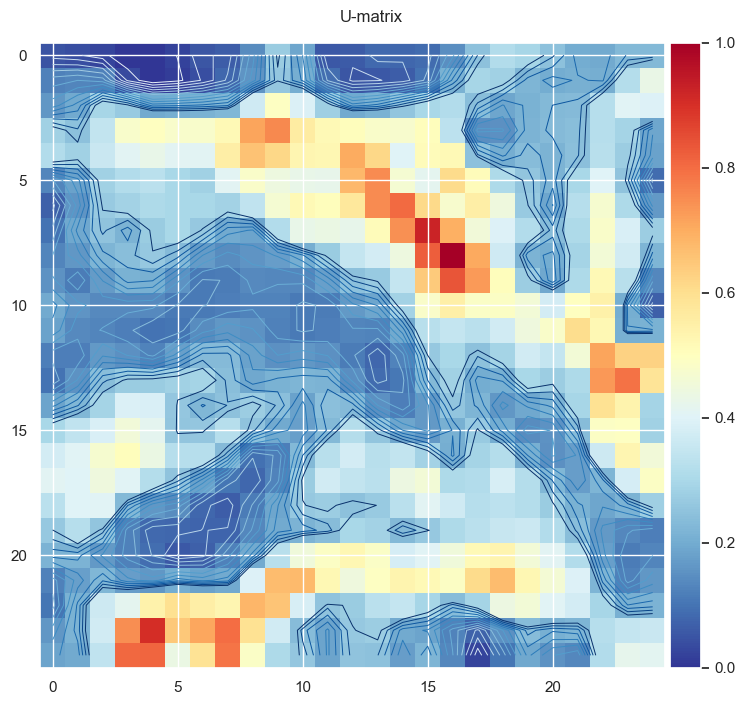

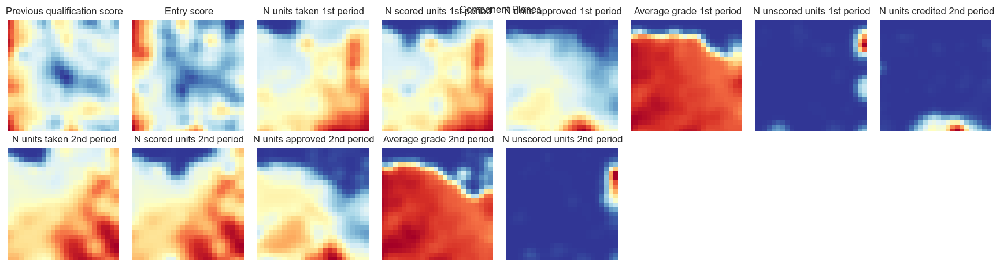

,Previous qualification score,Entry score,N units taken 1st period,N scored units 1st period,N units approved 1st period,Average grade 1st period,N unscored units 1st period,N units credited 2nd period,N units taken 2nd period,N scored units 2nd period,N units approved 2nd period,Average grade 2nd period,N unscored units 2nd period,bmu,label
Userid,,,,,,,,,,,,,,,
699,0.473684,0.473684,0.60,0.60,0.277778,0.667550,0.0,0.000000,0.733333,0.733333,0.428571,0.630769,0.000000,518,0
456,0.368421,0.208421,0.45,0.45,0.333333,0.591611,0.0,0.076923,1.000000,1.000000,0.142857,0.592308,0.083333,446,0
647,0.421053,0.273684,0.55,0.55,0.277778,0.593377,0.0,0.000000,1.000000,1.000000,0.071429,0.538462,0.000000,472,0
383,0.421053,0.273684,0.65,0.65,0.166667,0.547461,0.0,0.000000,0.800000,0.800000,0.214286,0.556410,0.000000,474,0
1217,0.305263,0.238947,0.50,0.50,0.277778,0.635762,0.0,0.000000,0.733333,0.733333,0.357143,0.646154,0.000000,392,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4144,0.368421,0.192632,0.75,0.75,0.277778,0.656954,0.0,0.000000,0.933333,0.933333,0.500000,0.654231,0.000000,573,0
2761,0.578947,0.336842,0.40,0.40,0.333333,0.691214,0.0,0.153846,0.666667,0.666667,0.357143,0.716490,0.000000,512,0
4410,0.473684,0.291579,0.25,0.25,0.277778,0.773510,0.0,0.000000,0.400000,0.400000,0.357143,0.771795,0.000000,181,2


In [32]:
somWrap(prepData(dataDF)[1],getClusters=True,nClusters=3)

# Model

In [33]:
def runAll(data: pd.DataFrame, getPairPlot: bool = False, getClusters: bool = True, nClusters: int = 4) -> None:
    """Runs the algorithm

    Args:
        X_train (pd.DataFrame): Raw/Un-preprocessed X_train dataframe
        Y_train (pd.DataFrame): Raw/Un-preprocessed Y_train dataframe
        X_test (pd.DataFrame): Raw/Un-preprocessed X_test dataframe
        split (bool, optional): Whether or not to split the dataframes using train_test_split, used for model assessment. Defaults to False.
    """

    dataDF, dataAcademic, dataDemographic = prepData(data)

    if getPairPlot:
        pairPlots(dataAcademic, "AcademicPairPlot")
        pairPlots(dataDemographic, "DemographicPairPlot")

    somWrap(dataAcademic, getClusters, nClusters)
    somWrap(dataDemographic, getClusters, nClusters)

/tmp/ipykernel_4423/739561389.py:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Father\'s qualification'].replace(education,inplace=True)
/tmp/ipykernel_4423/739561389.py:41: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpla

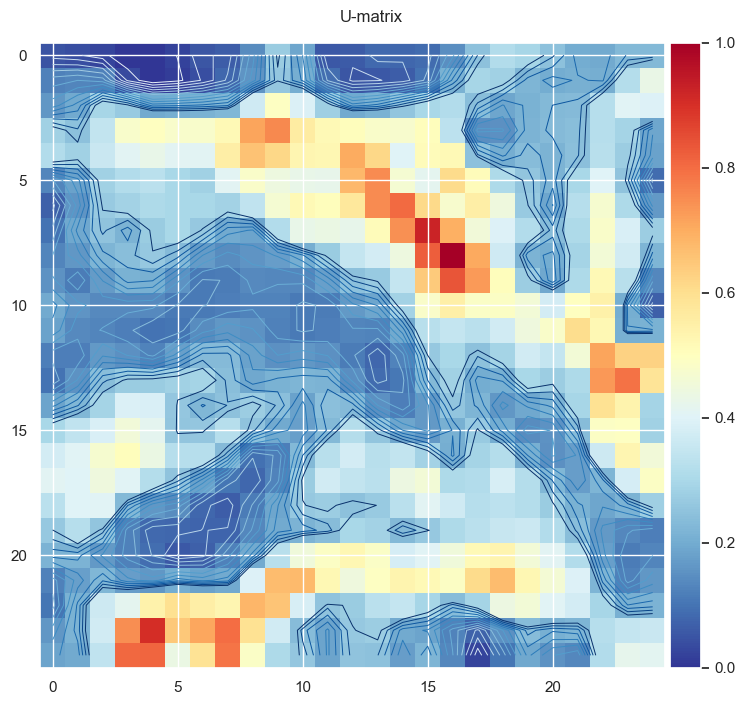

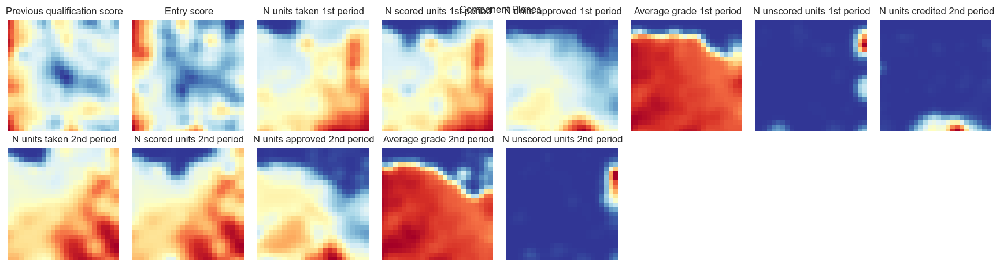

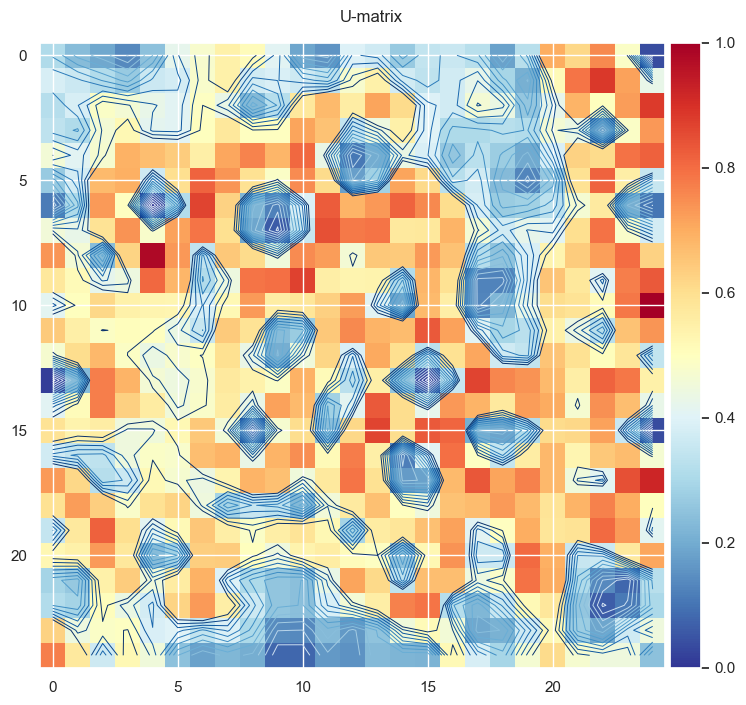

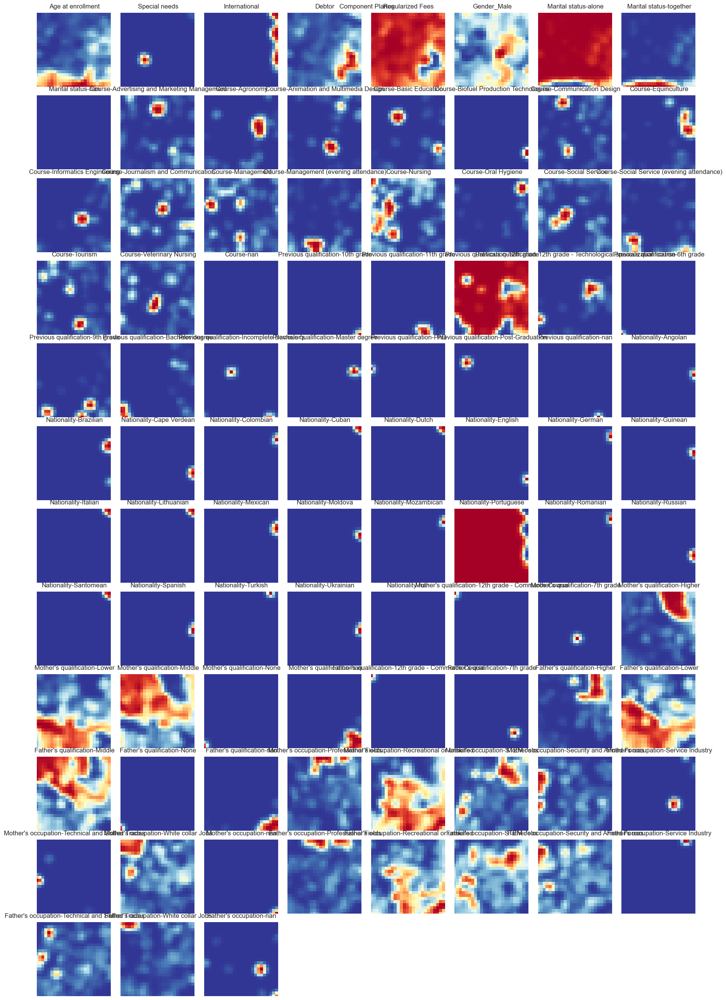

In [34]:
runAll(dataDF)

In [35]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)

    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)

        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        color = sns.color_palette('Dark2')

        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=color, ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=16, fontweight = 'heavy')
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=16)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=16)


    plt.subplots_adjust(hspace=0.4, top=0.90, bottom = 0.2)
    plt.suptitle("Cluster Profiling", fontsize=23)
    plt.show()

# SOM function

In [36]:
def somFunc(df_som,rows,cols,umat=False,componentPlanes=False,componentColumns=[]):
  mapsize=[rows,cols]
  som = SOMFactory().build(df_som, mapsize, mask=None,
                         mapshape='planar', # 2Dimensions
                         lattice='rect', # topology: 'rect' or 'hexa'
                         normalization='var', # standardize the variables
                         initialization='pca', # initialization of the weights: 'pca' or 'random'
                         neighborhood='gaussian', # neighborhood function: 'gaussian' or 'bubble'
                         training='batch') # training mode: 'seq' or 'batch'
  som.train(n_job=1, verbose=False, train_rough_len=3, train_finetune_len=5)

  if umat == True:
    u = sompy.umatrix.UMatrixView(rows, cols, title='U-matrix', show_axis=True, text_size=8, show_text=True)

  #This is the Umat value
  UMAT  = u.build_u_matrix(som, distance=1, row_normalized=False)

  #Here you have Umatrix plus its render
  _, umat = u.show(som, distance=1, row_normalized=True, contour=True, blob=False)

  if componentPlanes == True:
    som.component_names = componentColumns
    comp_planes = sompy.mapview.View2DPacked(rows, cols, 'Component Planes', text_size=8)
    comp_planes.show(som, what='codebook', which_dim='all', col_sz=8)

  return som

#AcademData

In [37]:
addAverages(dataDF)

In [38]:
academicData=['Entry score','Average scored units','Average grades','Average units taken','Average units approved','Average units credited','Average unscored units','Success']

In [39]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataAcademicDF = data[academicData]
dataAcademic = getDummies(dataAcademicDF)
dataAcademic = scaleData(dataAcademicDF)
data = getDummies(data)
data = scaleData(data)
dataAcademicDF=scaleData(dataAcademicDF)

/tmp/ipykernel_4423/739561389.py:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Father\'s qualification'].replace(education,inplace=True)
/tmp/ipykernel_4423/739561389.py:41: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpla

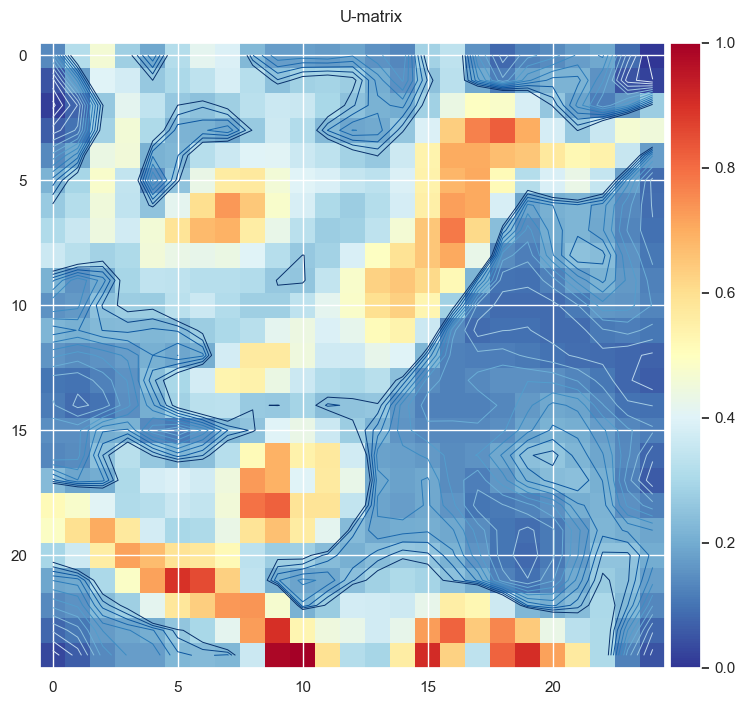

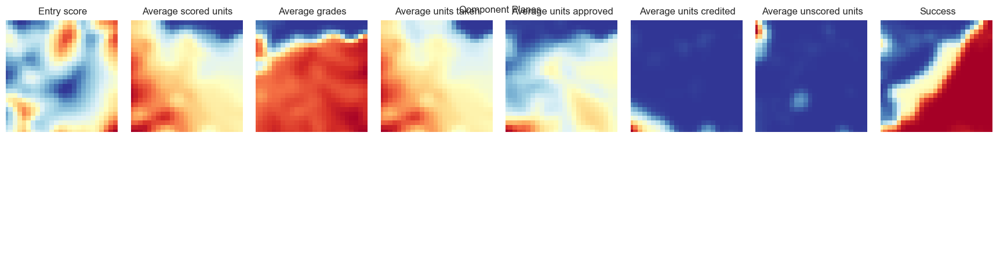

In [40]:
som=somFunc(np.float32(dataAcademicDF),25,25,True,True,dataAcademicDF.columns)

In [93]:
# cl = som.cluster(n_clusters=4)
bmus = som.project_data(dataAcademic)
som.cluster(n_clusters=3)
labels = getattr(som, 'cluster_labels')

/home/oakei/Documents/GitHub/mlproj/.venv/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


In [100]:
def kekw(somds):
    h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
    h.show(somds)
    return h

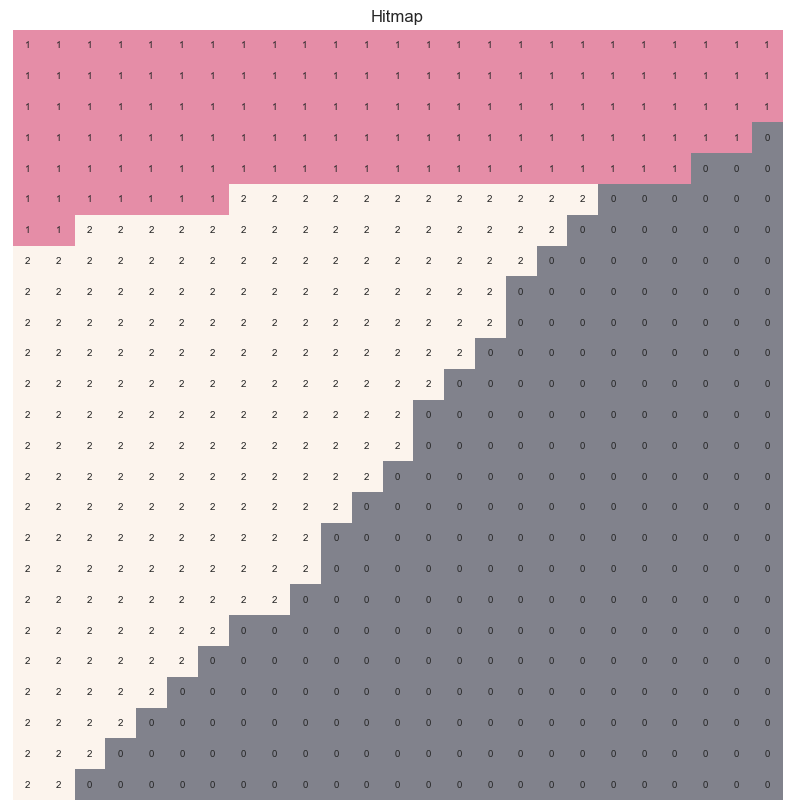

In [101]:
kekw(som)

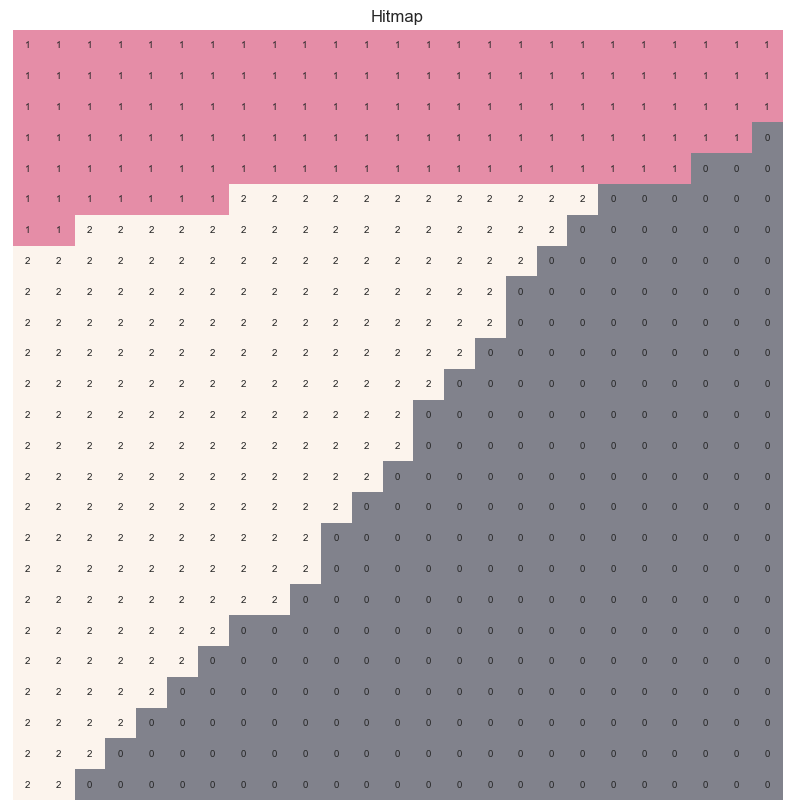

In [98]:
h = sompy.hitmap.HitMapView(10, 10, 'Hitmap', text_size=8, show_text=True)
h.show(som)

In [43]:
dataAcademicDF['bmu'] = bmus
dataAcademicDF['label'] = labels[dataAcademicDF['bmu']]

academicResults=dataDF.copy(deep=True)
academicResults['label']=dataAcademicDF['label']

/tmp/ipykernel_4423/2266322349.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


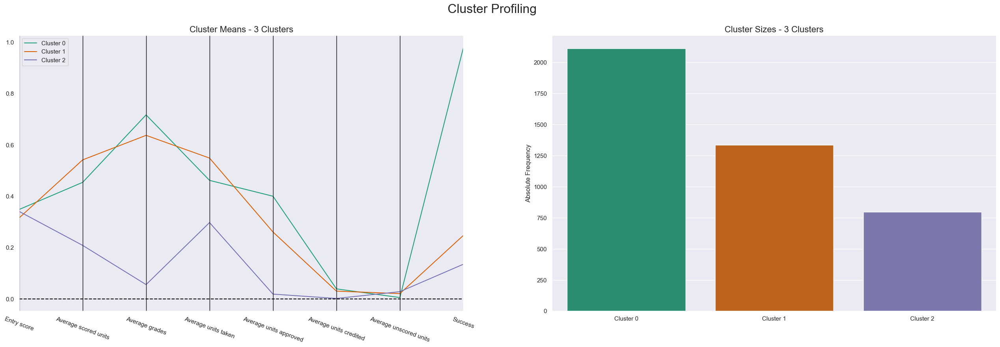

In [44]:
cluster_profiles(dataAcademicDF[academicData].join(dataAcademicDF['label']),["label"],figsize=(32, 10))

  0%|          | 0/8 [00:00<?, ?it/s]

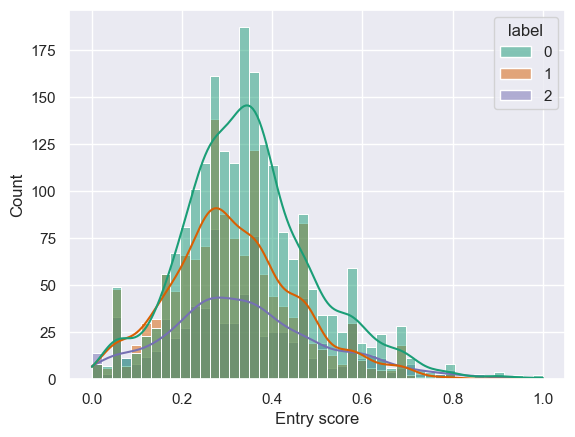

 12%|█▎        | 1/8 [00:00<00:01,  4.42it/s]

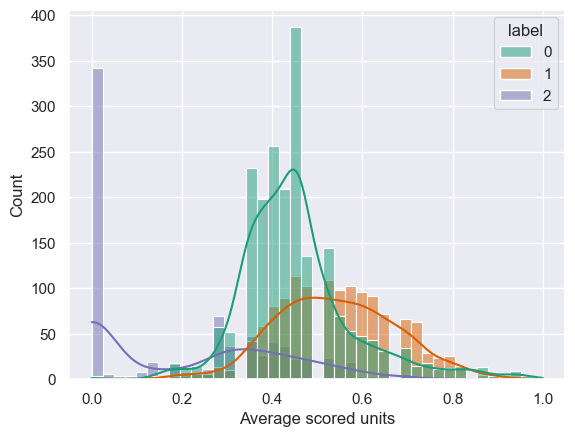

 25%|██▌       | 2/8 [00:00<00:01,  4.43it/s]

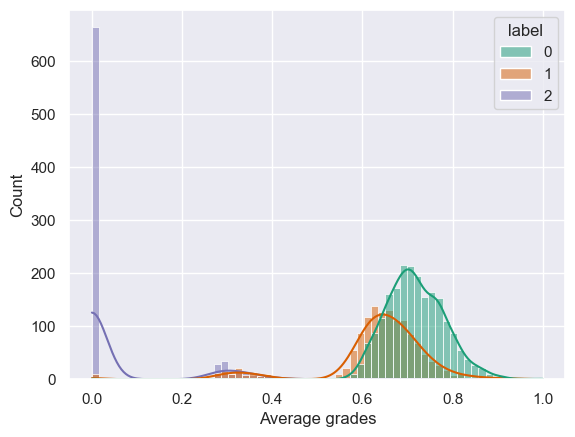

 38%|███▊      | 3/8 [00:00<00:01,  3.62it/s]

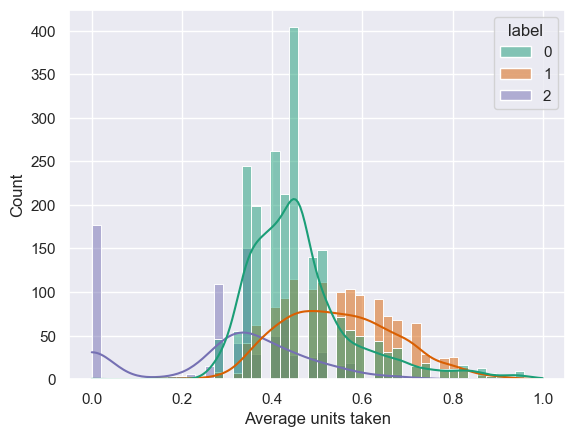

 50%|█████     | 4/8 [00:01<00:01,  3.92it/s]

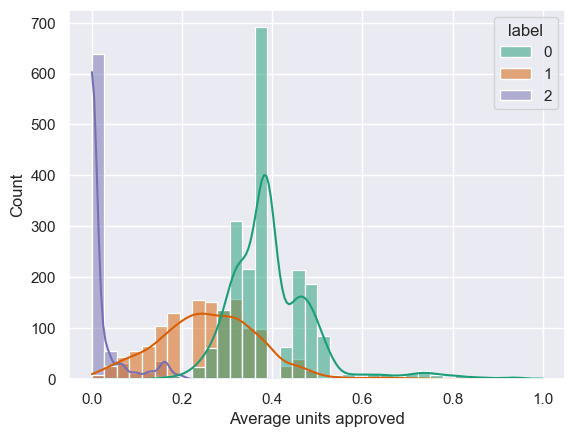

 62%|██████▎   | 5/8 [00:01<00:00,  4.24it/s]

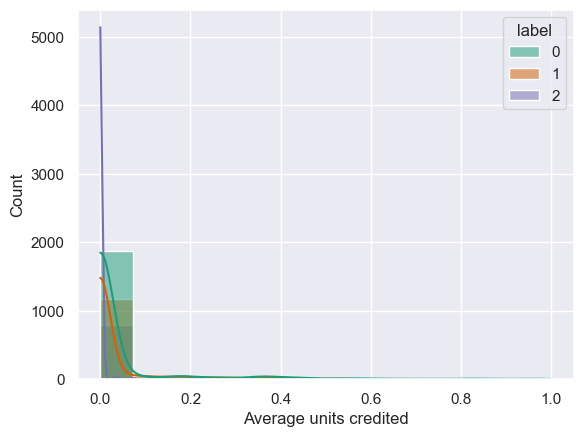

 75%|███████▌  | 6/8 [00:01<00:00,  4.60it/s]

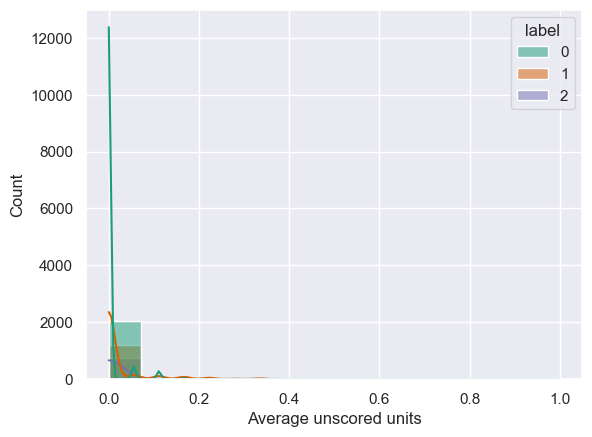

 88%|████████▊ | 7/8 [00:01<00:00,  4.91it/s]

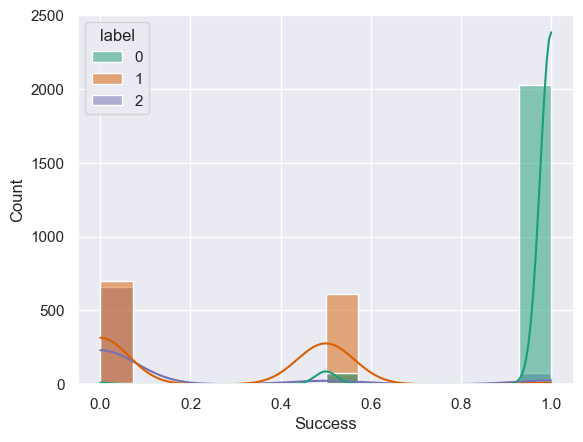

100%|██████████| 8/8 [00:01<00:00,  4.59it/s]


In [45]:
for i in tqdm(dataAcademicDF[academicData].columns):
    sns.histplot(dataAcademicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [46]:
academicData.remove('Average unscored units')
academicData.remove('Average units credited')

In [47]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataAcademicDF = data[academicData]
dataAcademic = getDummies(dataAcademicDF)
dataAcademic = scaleData(dataAcademicDF)
data = getDummies(data)
data = scaleData(data)
dataAcademicDF=scaleData(dataAcademicDF)

/tmp/ipykernel_4423/739561389.py:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Father\'s qualification'].replace(education,inplace=True)
/tmp/ipykernel_4423/739561389.py:41: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpla

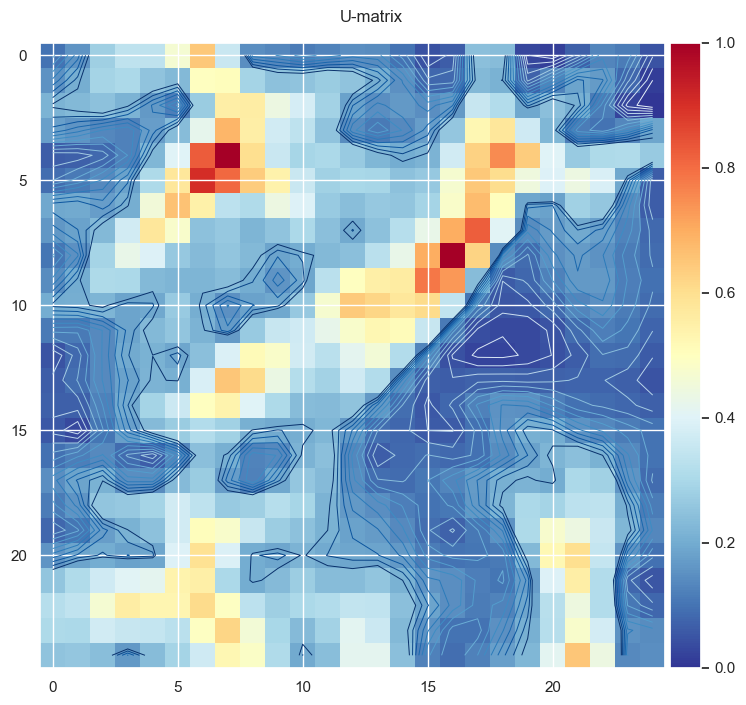

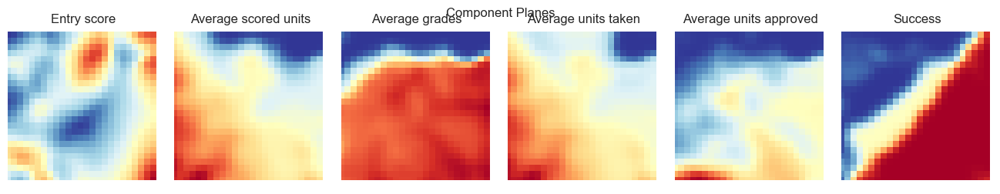

In [48]:
som=somFunc(np.float32(dataAcademicDF),25,25,True,True,dataAcademicDF.columns)

In [49]:
dataAcademicDF['bmu'] = bmus
dataAcademicDF['label'] = labels[dataAcademicDF['bmu']]

academicResults=dataDF.copy(deep=True)
academicResults['label']=dataAcademicDF['label']

/tmp/ipykernel_4423/2266322349.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


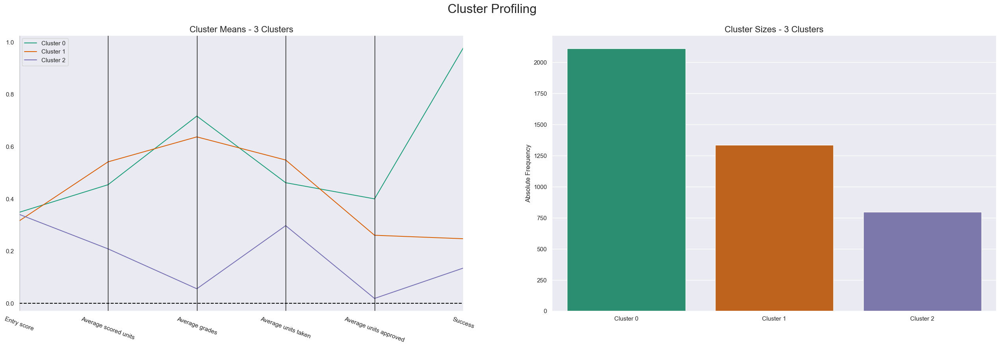

In [50]:
cluster_profiles(dataAcademicDF[academicData].join(dataAcademicDF['label']),["label"],figsize=(32, 10))

  0%|          | 0/6 [00:00<?, ?it/s]

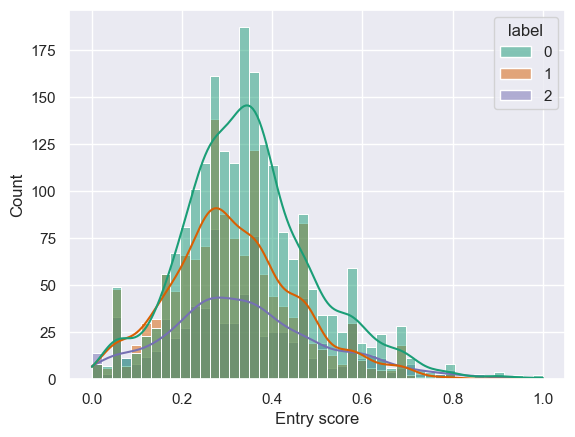

 17%|█▋        | 1/6 [00:00<00:01,  4.59it/s]

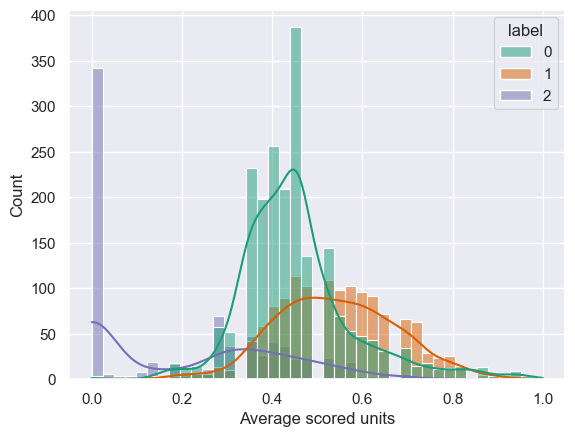

 33%|███▎      | 2/6 [00:00<00:00,  4.68it/s]

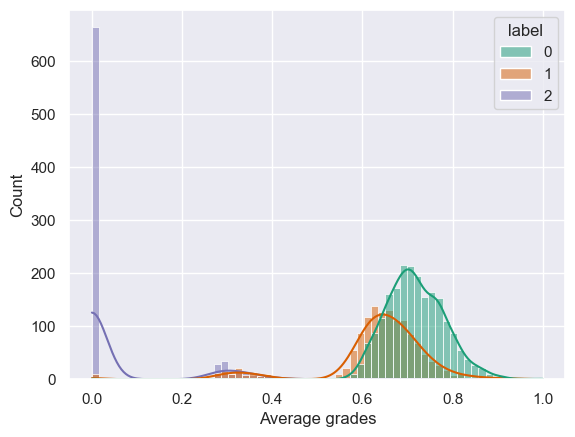

 50%|█████     | 3/6 [00:00<00:00,  4.27it/s]

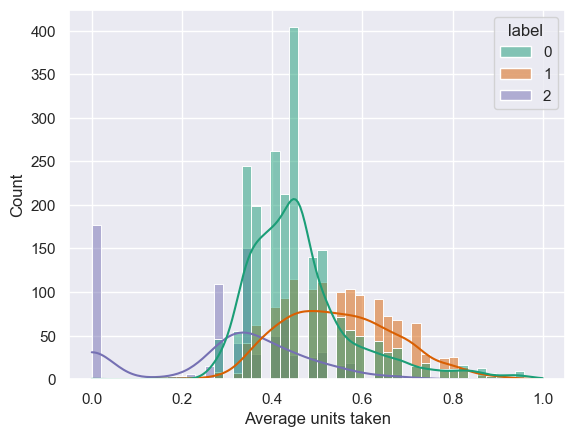

 67%|██████▋   | 4/6 [00:00<00:00,  4.38it/s]

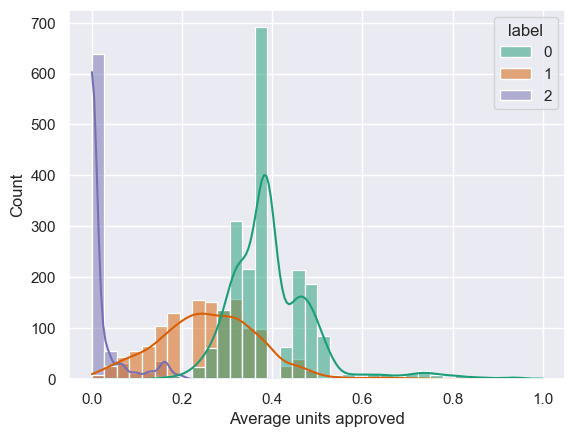

 83%|████████▎ | 5/6 [00:01<00:00,  4.56it/s]

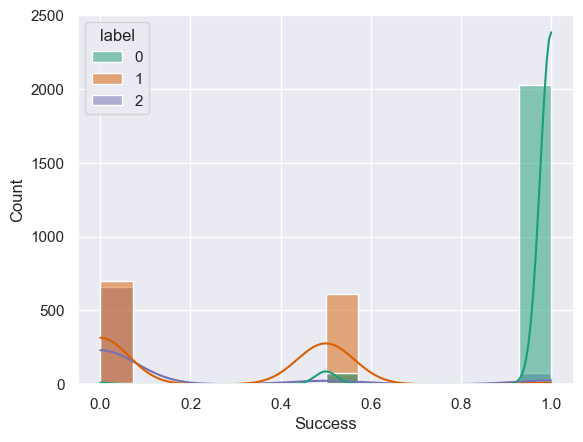

100%|██████████| 6/6 [00:01<00:00,  4.72it/s]


In [51]:
for i in tqdm(dataAcademicDF[academicData].columns):
    sns.histplot(dataAcademicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [52]:
academicResults[academicData+['label']].groupby(['label']).describe().T

label                                   0            1           2
Entry score            count  2111.000000  1336.000000  798.000000
                       mean    128.076741   124.951198  127.340977
                       std      14.026042    13.572086   16.503241
                       min      95.000000    95.000000   95.000000
                       25%     119.200000   116.175000  116.925000
                       50%     127.000000   123.550000  126.100000
                       75%     135.450000   132.525000  137.450000
                       max     190.000000   190.000000  183.500000
Average scored units   count  2111.000000  1336.000000  798.000000
                       mean      7.941971     9.474925    3.644110
                       std       2.204223     2.351095    3.635947
                       min       0.000000     0.000000    0.000000
                       25%       6.500000     8.000000    0.000000
                       50%       7.500000     9.500000    3.250000
                       75%       8.500000    11.000000    6.500000
                       max      17.500000    16.500000   12.500000
Average grades         count  2111.000000  1336.000000  798.000000
                       mean     13.105347    11.646949    1.012858
                       std       1.242765     2.158212    2.326321
                       min       0.000000     0.000000    0.000000
                       25%      12.300000    11.175595    0.000000
                       50%      13.011905    11.900000    0.000000
                       75%      13.916667    12.750000    0.000000
                       max      18.283654    17.166667   13.670000
Average units taken    count  2111.000000  1336.000000  798.000000
                       mean      8.076978     9.598054    5.199248
                       std       2.092046     2.218606    3.176790
                       min       0.000000     3.000000    0.000000
                       25%       6.500000     8.000000    4.500000
                       50%       8.000000     9.500000    6.000000
                       75%       9.000000    11.000000    7.500000
                       max      17.500000    16.500000   12.500000
Average units approved count  2111.000000  1336.000000  798.000000
                       mean      6.195879     4.034805    0.283835
                       std       1.584171     1.745112    0.693184
                       min       0.000000     0.000000    0.000000
                       25%       5.000000     3.000000    0.000000
                       50%       6.000000     4.000000    0.000000
                       75%       7.000000     5.000000    0.000000
                       max      15.500000    11.500000    4.000000
Success                count  2111.000000  1336.000000  798.000000
                       mean      1.956419     0.494012    0.269424
                       std       0.224126     0.533487    0.618690
                       min       0.000000     0.000000    0.000000
                       25%       2.000000     0.000000    0.000000
                       50%       2.000000     0.000000    0.000000
                       75%       2.000000     1.000000    0.000000
                       max       2.000000     2.000000    2.000000

# Demographic K means

In [53]:
# demographicData=['Mother\'s qualification','Father\'s qualification']
# demographicData=['Mother\'s occupation','Father\'s occupation']
# demographicData=['Age at enrollment','Marital status','Special needs']
demographicData: list[str] = ['Age at enrollment','Marital status','Course','Previous qualification','Nationality','Mother\'s qualification',
       'Father\'s qualification','Mother\'s occupation','Father\'s occupation','Special needs','International','Debtor','Regularized Fees','Gender_Male']


In [54]:
data = encodeSuccess(dataDF)
data = fillNa(data)
data = removeOutliers(data)
data = groupValues(data)
dataDFGrouped=removeOutliers(dataDF)
dataDFGrouped=groupValues(dataDFGrouped)
dataDemographicDF = data[demographicData]
dataDemographicDF = getDummies(dataDemographicDF)
dataDemographicDF = scaleData(dataDemographicDF)
data = getDummies(data)
data = scaleData(data)

/tmp/ipykernel_4423/739561389.py:40: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Father\'s qualification'].replace(education,inplace=True)
/tmp/ipykernel_4423/739561389.py:41: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpla

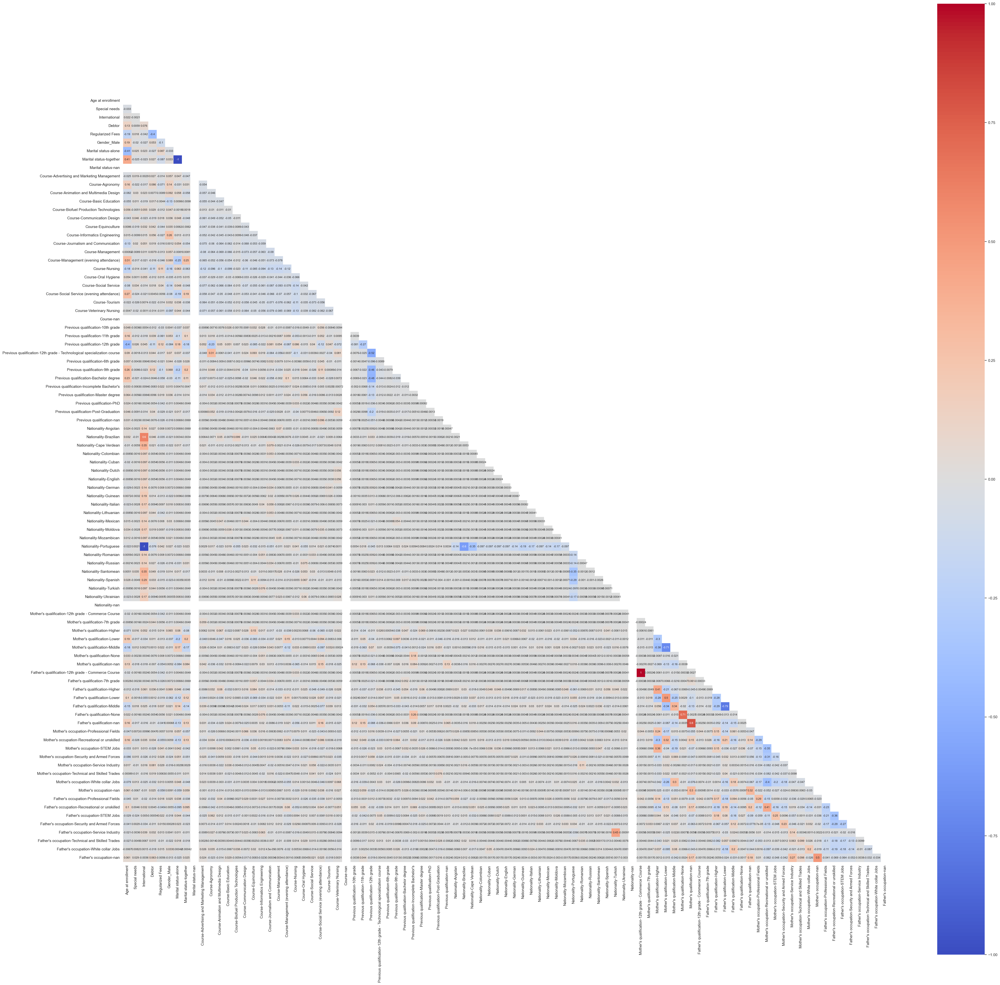

In [55]:
mask = np.zeros_like(dataDemographicDF.corr("spearman"))
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(50,50))
    ax = sns.heatmap(dataDemographicDF.corr("spearman"),mask=mask, annot = True,cmap='coolwarm',square=True,vmin=-1, vmax=1)

In [56]:
cor_spearman = dataDemographicDF[dataDemographicDF.columns].corr(method='spearman')
cor_spearman

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
# display only highly correlated (>=90%) features
threshold=0.8

mask = cor_spearman.abs() > threshold

high_cor = cor_spearman[mask].stack().reset_index()
high_cor.columns = ['Feature 1', 'Feature 2', 'Correlation']

# filter out where Feature1==Feature2
mask = high_cor['Feature 1'] == high_cor['Feature 2']
high_cor_filtered = high_cor[~mask]

high_cor_filtered

,Feature 1,Feature 2,Correlation
3,International,Nationality-Portuguese,-1.000000
8,Marital status-alone,Marital status-together,-1.000000
9,Marital status-together,Marital status-alone,-1.000000
54,Nationality-Portuguese,International,-1.000000
63,Mother's qualification-12th grade - Commerce C...,Father's qualification-12th grade - Commerce C...,1.000000
70,Mother's qualification-nan,Father's qualification-nan,0.802756
71,Father's qualification-12th grade - Commerce C...,Mother's qualification-12th grade - Commerce C...,1.000000
78,Father's qualification-nan,Mother's qualification-nan,0.802756


In [57]:
toRemove=['Nationality-Portuguese','Marital status-together','Mother\'s qualification-12th grade - Commerce Course','Mother\'s qualification-nan']

In [58]:
dataDemographicDF.drop(toRemove,axis=1,inplace=True)
toRemove=[]

In [59]:
from sklearn.cluster import KMeans

In [60]:
#setting range for possible values o k - 1 to 12
ks = range(1, 20)
inertias = [] #Creating pretty list to store results in

for k in tqdm(ks):
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(dataDemographicDF)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

100%|██████████| 19/19 [00:02<00:00,  8.79it/s]


### elbow

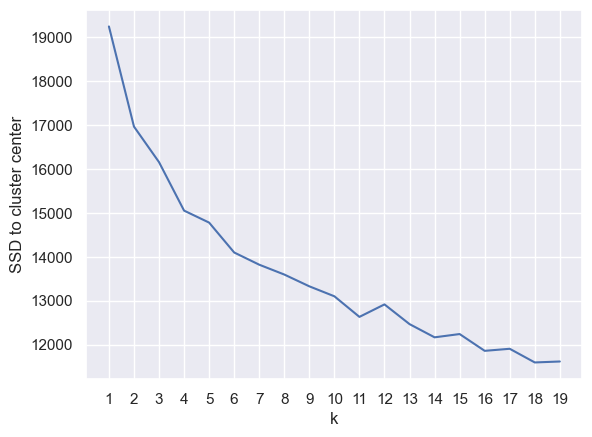

In [61]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot().
plt.plot(ks, inertias)

# define the label for x axis as 'k'
plt.xlabel('k')
# define the label for y axis as 'SSD'
plt.ylabel('SSD to cluster center')
# define the ticks in x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

### Silhuette score

In [62]:
from sklearn.metrics import silhouette_score

##setting range for possible values o k - 2 to 12
ks = range(2, 21)
sil_score = [] #Creating pretty list to store results in

for k in tqdm(ks):
#    # Create a KMeans instance with k clusters: model
   model = KMeans(n_clusters=k)

#    # Fit model to samples
   model.fit_predict(dataDemographicDF)

#    # Calculate Silhoutte Score
   sil_score.append(silhouette_score(dataDemographicDF, model.labels_, metric='euclidean'))

100%|██████████| 19/19 [00:07<00:00,  2.51it/s]


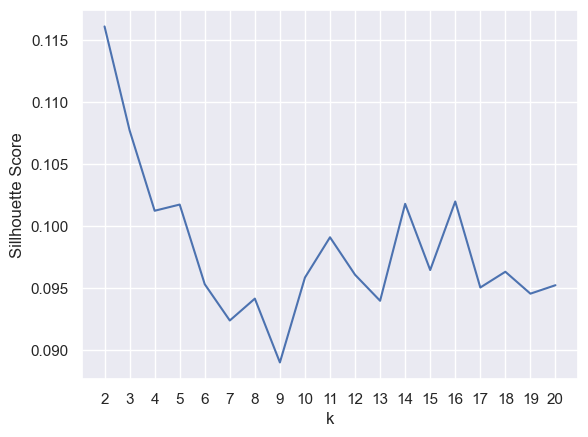

In [63]:
plt.plot(ks, sil_score)

## define the label for x axis as 'k'
plt.xlabel('k')
## define the label for y axis as 'Silhouette Score'
plt.ylabel('Sillhouette Score')
## define the ticks in x axis using the values of ks
plt.xticks(ks)
## call plt.show()
plt.show()

### Hierarchical

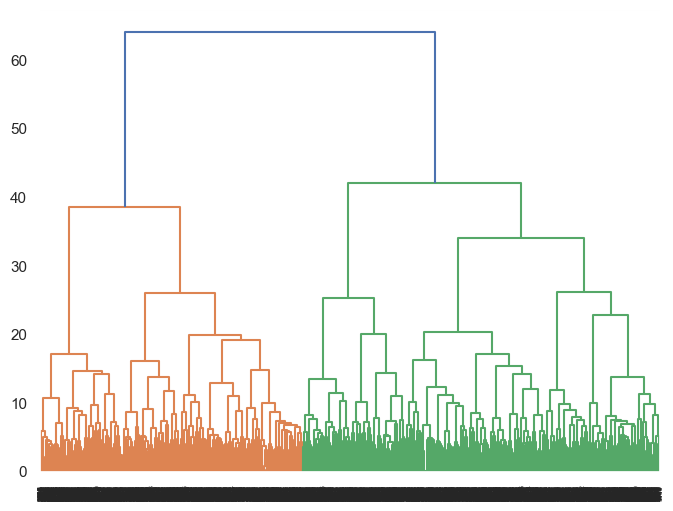

In [64]:
from scipy.cluster import hierarchy
##from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

## create clusters using the "ward method"
clusters = hierarchy.linkage(dataDemographicDF, method="ward")

## create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)
plt.show()
#plt.savefig("images/Hierarchical_results_artist_perspective.png", dpi=300)

In [65]:
kmeans_2 = KMeans(n_clusters = 3, random_state = 100).fit(dataDemographicDF)

In [66]:
dataDemographicDF['label'] = kmeans_2.predict(dataDemographicDF)

/tmp/ipykernel_4423/2266322349.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


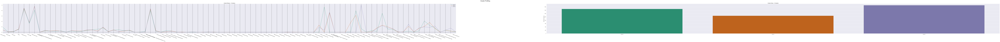

In [67]:
#profiling the cluster with the function
cluster_profiles(dataDemographicDF, ["label"], figsize=(300, 10))

Many of the features have a low variability between clusters, so will be removed

### Removing low variance features

In [68]:
nationality = [s for s in dataDemographicDF.columns if s.startswith("Nationality")]
course=[s for s in dataDemographicDF.columns if s.startswith("Course")]
prevQual=[s for s in dataDemographicDF.columns if s.startswith("Previous qualification")]


In [69]:
toRemove=['Special needs','International','Debtor','Regularized Fees','Marital status-nan',
          'Father\'s qualification-7th grade','Father\'s qualification-7th grade',
          'Father\'s qualification-None','Mother\'s occupation-Service Industry',
          'Mother\'s occupation-White collar Jobs','Father\'s occupation-Professional Fields',
          'Father\'s occupation-Service Industry','Father\'s occupation-Technical and Skilled Trades',
          'Father\'s occupation-White collar Jobs','Father\'s occupation-nan',
          'Mother\'s qualification-7th grade','Mother\'s qualification-None',
          'Father\'s qualification-12th grade - Commerce Course',
          'Mother\'s occupation-Technical and Skilled Trades',
          'Mother\'s occupation-nan','Father\'s occupation-Security and Armed Forces']

In [70]:
dataDemographicDF.drop(nationality,inplace=True,axis=1)
dataDemographicDF.drop(course,inplace=True,axis=1)
dataDemographicDF.drop(prevQual,inplace=True,axis=1)
dataDemographicDF.drop(toRemove,inplace=True,axis=1)

In [71]:
#setting range for possible values o k - 1 to 12
ks = range(1, 20)
inertias = [] #Creating pretty list to store results in

for k in tqdm(ks):
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(dataDemographicDF)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

100%|██████████| 19/19 [00:02<00:00,  9.23it/s]


### Elbow

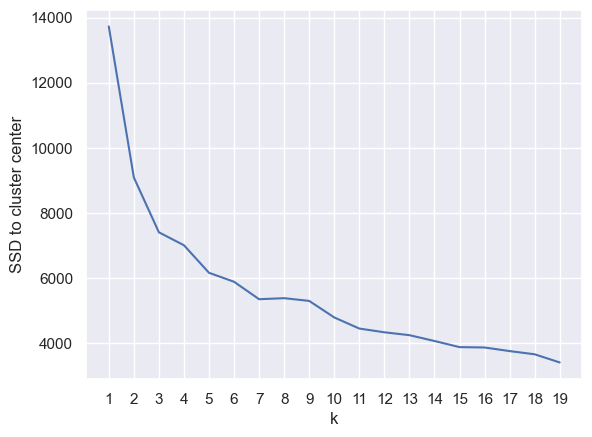

In [72]:
# Plot ks (x-axis) vs inertias (y-axis) using plt.plot().
plt.plot(ks, inertias)

# define the label for x axis as 'k'
plt.xlabel('k')
# define the label for y axis as 'SSD'
plt.ylabel('SSD to cluster center')
# define the ticks in x axis using the values of ks
plt.xticks(ks)
# call plt.show()
plt.show()

### Silhuette score

In [73]:
from sklearn.metrics import silhouette_score

##setting range for possible values o k - 2 to 12
ks = range(2, 20)
sil_score = [] #Creating pretty list to store results in

for k in tqdm(ks):
#    # Create a KMeans instance with k clusters: model
   model = KMeans(n_clusters=k)

#    # Fit model to samples
   model.fit_predict(dataDemographicDF)

#    # Calculate Silhoutte Score
   sil_score.append(silhouette_score(dataDemographicDF, model.labels_, metric='euclidean'))

100%|██████████| 18/18 [00:06<00:00,  2.69it/s]


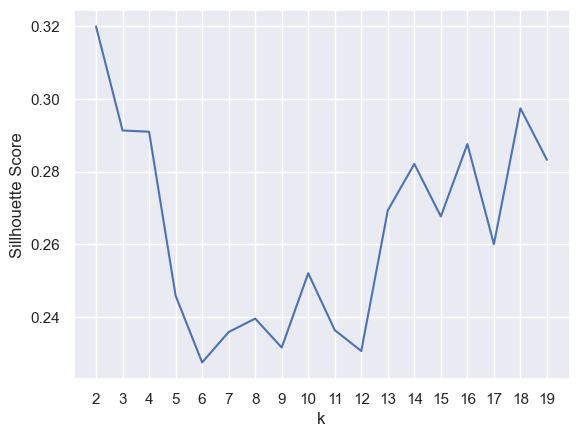

In [74]:
plt.plot(ks, sil_score)

## define the label for x axis as 'k'
plt.xlabel('k')
## define the label for y axis as 'Silhouette Score'
plt.ylabel('Sillhouette Score')
## define the ticks in x axis using the values of ks
plt.xticks(ks)
## call plt.show()
plt.show()

### Hierarchical

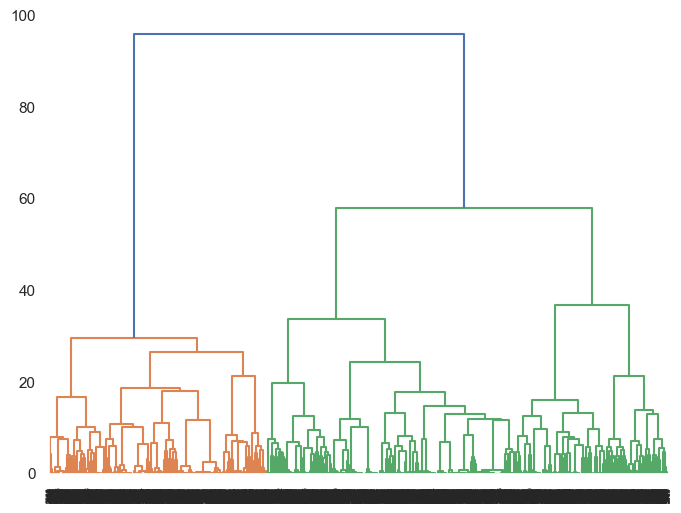

In [75]:
from scipy.cluster import hierarchy
##from sklearn.cluster import AgglomerativeClustering - The option available in sklearn

## create clusters using the "ward method"
clusters = hierarchy.linkage(dataDemographicDF, method="ward")

## create the dendrogram using the hierarchy.dendrogram() method.
plt.figure(figsize=(8, 6))
dendrogram = hierarchy.dendrogram(clusters)
plt.show()
#plt.savefig("images/Hierarchical_results_artist_perspective.png", dpi=300)

In [76]:
kmeans_2 = KMeans(n_clusters = 3, random_state = 100).fit(dataDemographicDF)

In [77]:
dataDemographicDF['label'] = kmeans_2.predict(dataDemographicDF)

/tmp/ipykernel_4423/2266322349.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:19: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


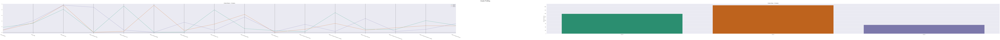

In [78]:
#profiling the cluster with the function
cluster_profiles(dataDemographicDF, ["label"], figsize=(300, 10))

  0%|          | 0/17 [00:00<?, ?it/s]

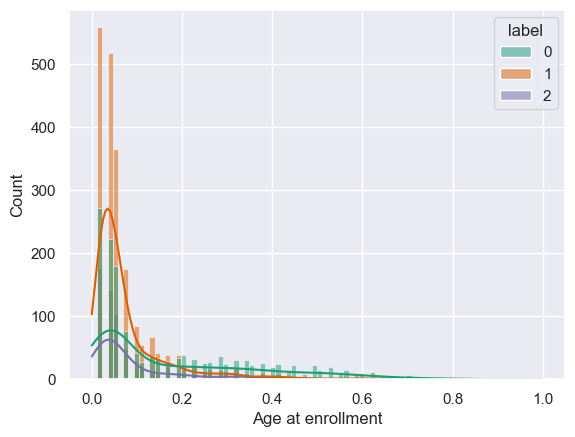

  6%|▌         | 1/17 [00:00<00:04,  3.54it/s]

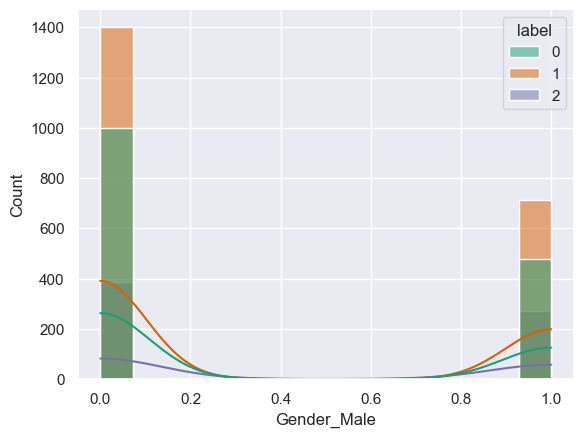

 12%|█▏        | 2/17 [00:00<00:03,  4.60it/s]

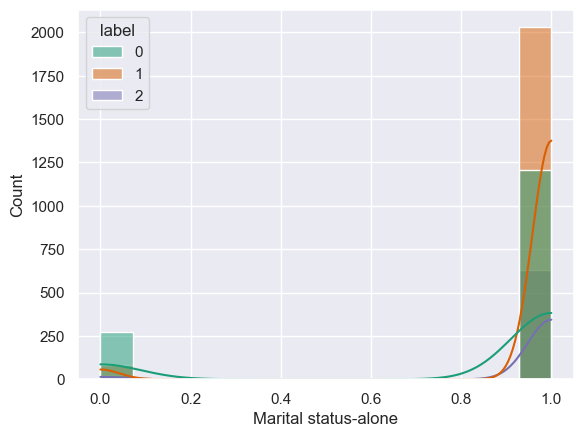

 18%|█▊        | 3/17 [00:00<00:02,  5.06it/s]

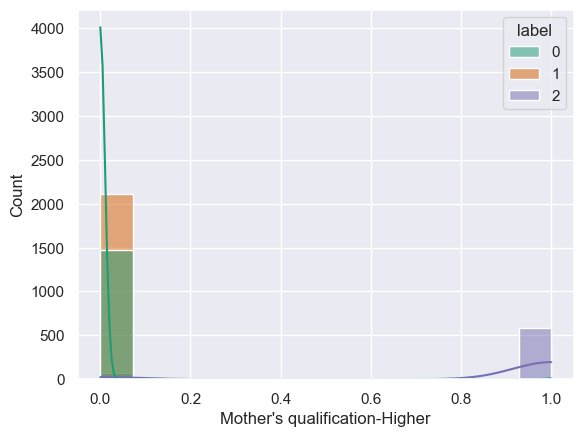

 24%|██▎       | 4/17 [00:00<00:02,  5.47it/s]

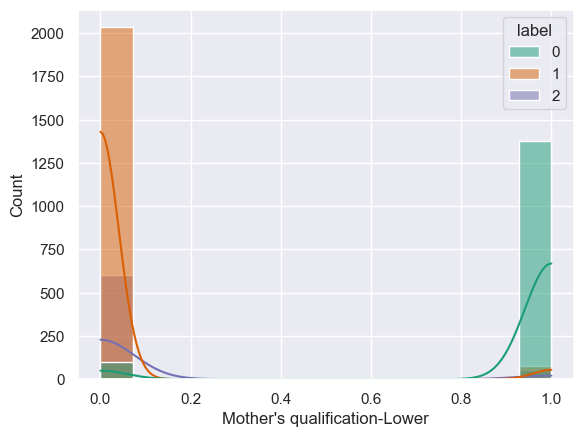

 29%|██▉       | 5/17 [00:00<00:02,  5.49it/s]

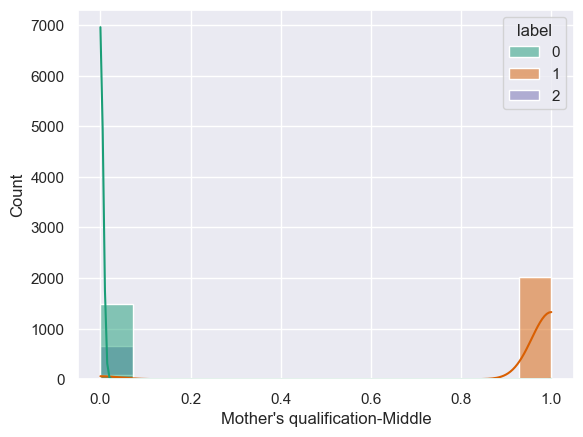

 35%|███▌      | 6/17 [00:01<00:01,  5.66it/s]

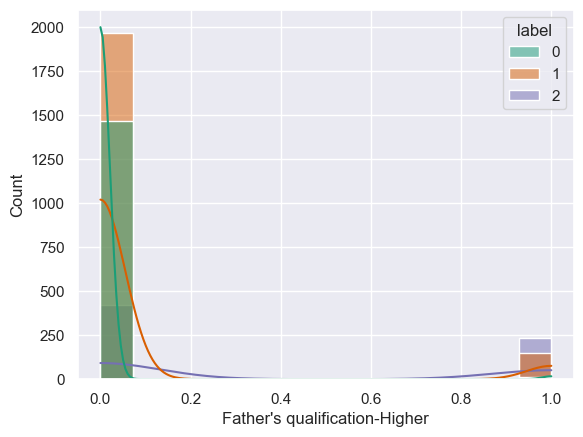

 41%|████      | 7/17 [00:01<00:01,  5.67it/s]

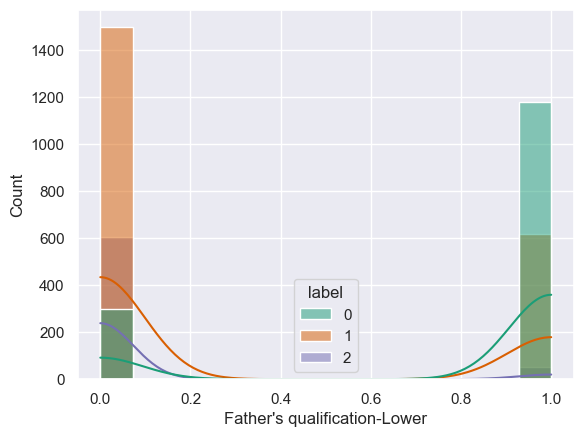

 47%|████▋     | 8/17 [00:01<00:01,  5.61it/s]

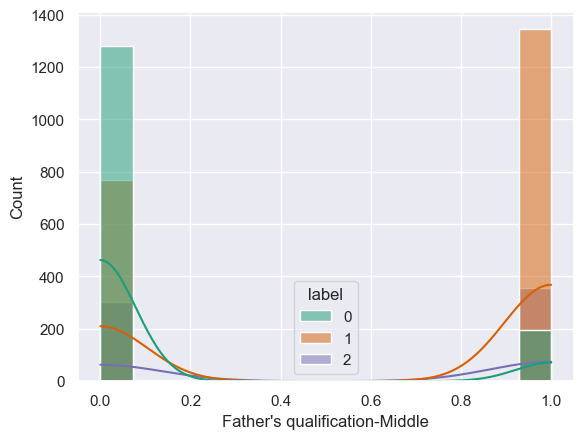

 53%|█████▎    | 9/17 [00:01<00:01,  5.59it/s]

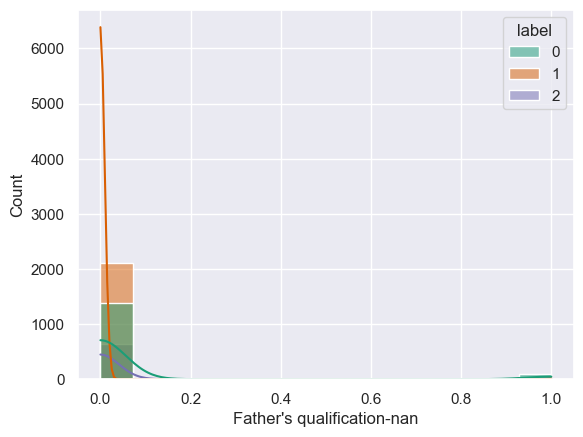

 59%|█████▉    | 10/17 [00:01<00:01,  5.47it/s]

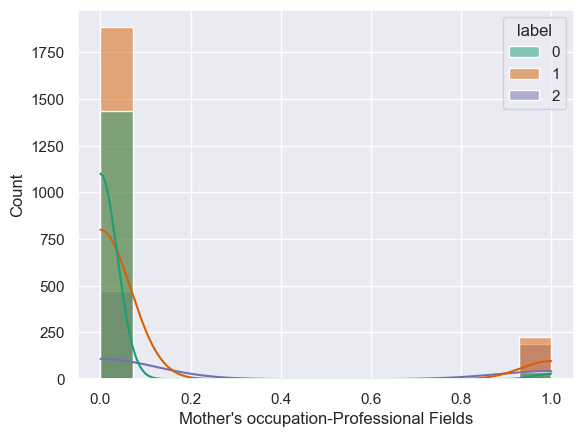

 65%|██████▍   | 11/17 [00:02<00:01,  5.43it/s]

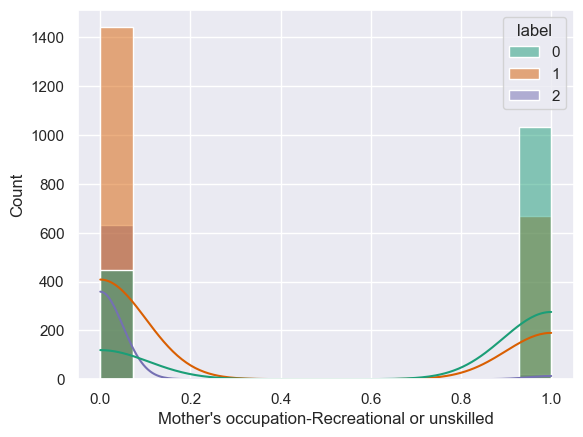

 71%|███████   | 12/17 [00:02<00:00,  5.11it/s]

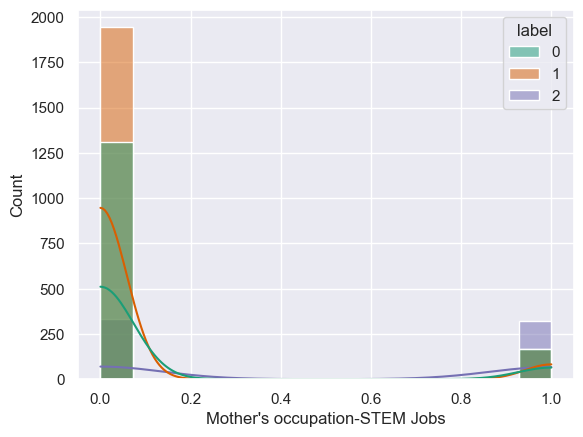

 76%|███████▋  | 13/17 [00:02<00:00,  5.18it/s]

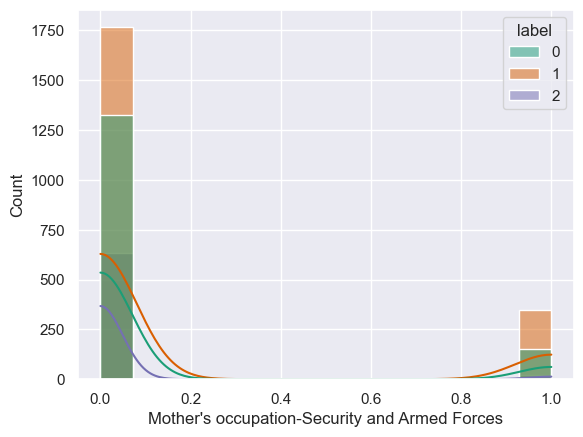

 82%|████████▏ | 14/17 [00:02<00:00,  5.30it/s]

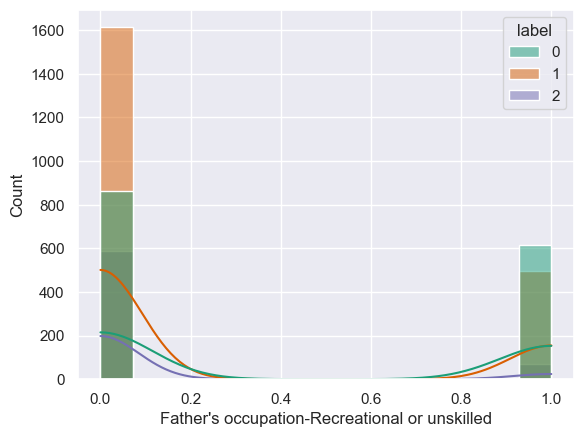

 88%|████████▊ | 15/17 [00:02<00:00,  5.38it/s]

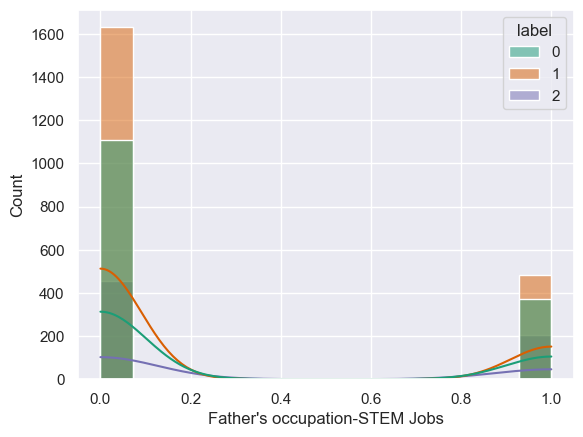

 94%|█████████▍| 16/17 [00:02<00:00,  5.46it/s]

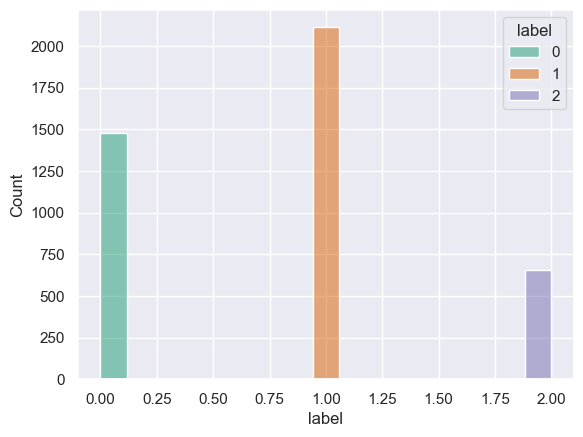

100%|██████████| 17/17 [00:03<00:00,  5.40it/s]


In [79]:
for i in tqdm(dataDemographicDF.columns):
    sns.histplot(dataDemographicDF, x = i, hue='label', kde = True, legend = True, palette = 'Dark2')
    plt.show()

### DF describe

In [80]:
dataDemographicDF.groupby(['label']).describe().T

label                                                          0            1  \
Age at enrollment                             count  1477.000000  2112.000000   
                                              mean      0.178383     0.076776   
                                              std       0.184123     0.088434   
                                              min       0.018868     0.000000   
                                              25%       0.037736     0.018868   
                                              50%       0.075472     0.037736   
                                              75%       0.283019     0.075472   
                                              max       1.000000     0.679245   
Gender_Male                                   count  1477.000000  2112.000000   
                                              mean      0.322952     0.336648   
                                              std       0.467763     0.472675   
                                              min       0.000000     0.000000   
                                              25%       0.000000     0.000000   
                                              50%       0.000000     0.000000   
                                              75%       1.000000     1.000000   
                                              max       1.000000     1.000000   
Marital status-alone                          count  1477.000000  2112.000000   
                                              mean      0.816520     0.960701   
                                              std       0.387191     0.194352   
                                              min       0.000000     0.000000   
                                              25%       1.000000     1.000000   
                                              50%       1.000000     1.000000   
                                              75%       1.000000     1.000000   
                                              max       1.000000     1.000000   
Mother's qualification-Higher                 count  1477.000000  2112.000000   
                                              mean      0.002031     0.000000   
                                              std       0.045038     0.000000   
                                              min       0.000000     0.000000   
                                              25%       0.000000     0.000000   
                                              50%       0.000000     0.000000   
                                              75%       0.000000     0.000000   
                                              max       1.000000     0.000000   
Mother's qualification-Lower                  count  1477.000000  2112.000000   
                                              mean      0.931618     0.036458   
                                              std       0.252486     0.187472   
                                              min       0.000000     0.000000   
                                              25%       1.000000     0.000000   
                                              50%       1.000000     0.000000   
                                              75%       1.000000     0.000000   
                                              max       1.000000     1.000000   
Mother's qualification-Middle                 count  1477.000000  2112.000000   
                                              mean      0.000677     0.957860   
                                              std       0.026020     0.200956   
                                              min       0.000000     0.000000   
                                              25%       0.000000     1.000000   
                                              50%       0.000000     1.000000   
                                              75%       0.000000     1.000000   
                                              max       1.000000     1.000000   
Father's qualification-Higher  

# Joining perspectives

In [81]:
data['academic_profile']=academicResults['label']
data['demographic_profile']=dataDemographicDF['label']

In [82]:
data['final_groups'] = data.groupby(['academic_profile', 'demographic_profile'], sort = False).ngroup()

In [83]:
unusedColumns=[s for s in data.columns if s not in dataDemographicDF.columns]
unusedColumns2=[s for s in data.columns if s not in academicData]

In [84]:
unusedColumns = set(unusedColumns)
unusedColumns2 = set(unusedColumns2)

unusedColumns.difference(unusedColumns2)
unusedColumns2.difference(unusedColumns)

usedColumnsAll=unusedColumns.difference(unusedColumns2).union(unusedColumns2.difference(unusedColumns))
usedColumnsAll

unusedColumnsAll=set(data.columns.difference(usedColumnsAll))
unusedColumnsAll

{'Application mode',
 'Application order',
 'Average grade 1st period',
 'Average grade 2nd period',
 'Average units credited',
 'Average unscored units',
 'Course-Advertising and Marketing Management',
 'Course-Agronomy',
 'Course-Animation and Multimedia Design',
 'Course-Basic Education',
 'Course-Biofuel Production Technologies',
 'Course-Communication Design',
 'Course-Equinculture',
 'Course-Informatics Engineering',
 'Course-Journalism and Communication',
 'Course-Management',
 'Course-Management (evening attendance)',
 'Course-Nursing',
 'Course-Oral Hygiene',
 'Course-Social Service',
 'Course-Social Service (evening attendance)',
 'Course-Tourism',
 'Course-Veterinary Nursing',
 'Course-nan',
 'Debtor',
 'Displaced',
 'External Funding',
 "Father's occupation-Professional Fields",
 "Father's occupation-Security and Armed Forces",
 "Father's occupation-Service Industry",
 "Father's occupation-Technical and Skilled Trades",
 "Father's occupation-White collar Jobs",
 "Father's o

In [85]:
unusedColumnsAll.remove('final_groups')

In [86]:
profiling_df=data.copy().drop(unusedColumnsAll,axis=1)

/tmp/ipykernel_4423/2266322349.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:19: UserWarning: 
The palette list has fewer values (8) than needed (9) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=label, y="counts", data=counts, ax=ax[1], palette = color)
/tmp/ipykernel_4423/2266322349.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(cluster_labels)


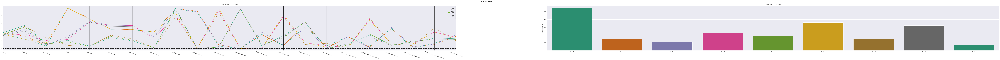

In [87]:
cluster_profiles(profiling_df, ["final_groups"], figsize=(200, 10))

  0%|          | 0/22 [00:00<?, ?it/s]

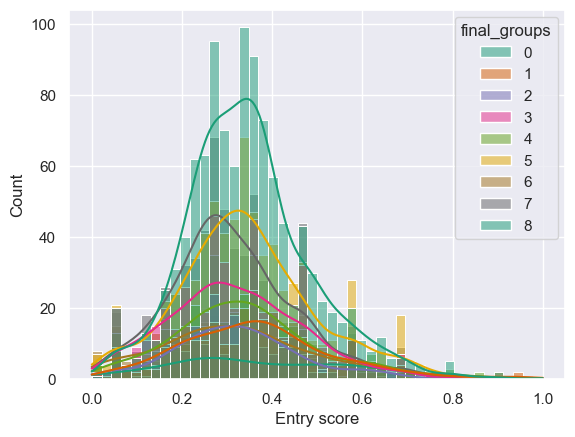

  5%|▍         | 1/22 [00:00<00:18,  1.16it/s]

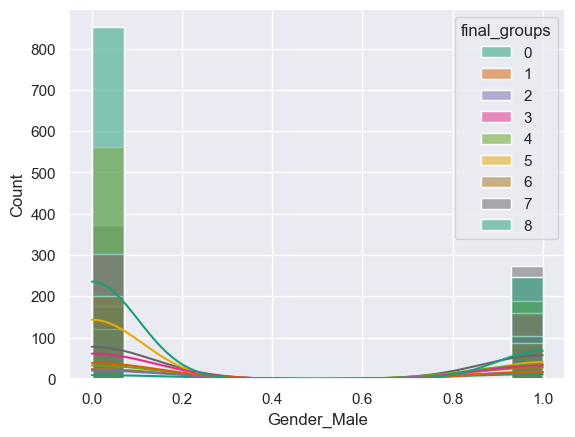

  9%|▉         | 2/22 [00:01<00:10,  1.96it/s]

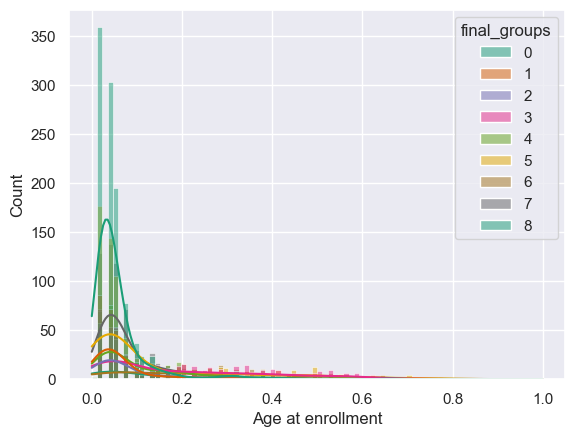

 14%|█▎        | 3/22 [00:01<00:10,  1.85it/s]

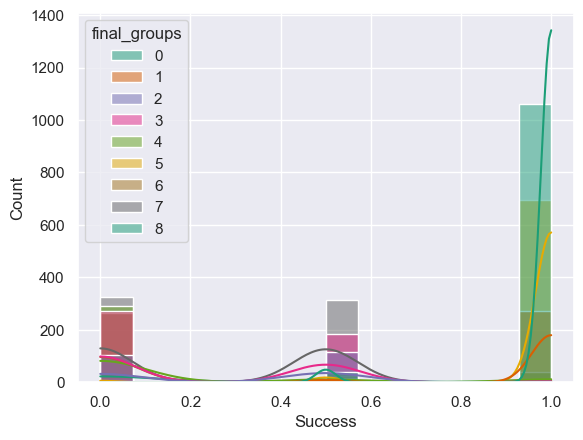

 18%|█▊        | 4/22 [00:01<00:07,  2.38it/s]

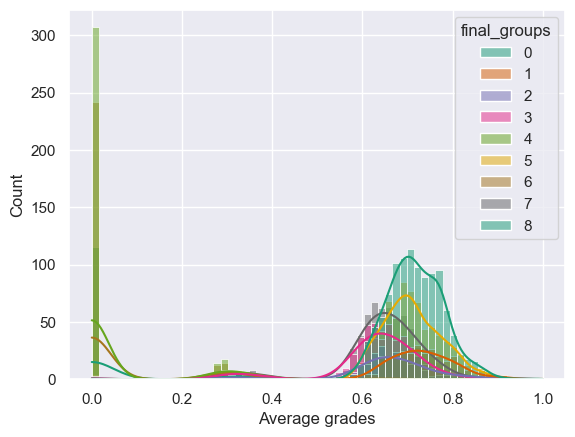

 23%|██▎       | 5/22 [00:02<00:07,  2.29it/s]

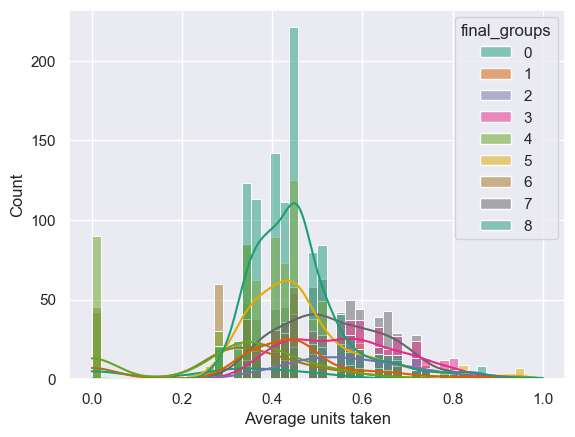

 27%|██▋       | 6/22 [00:02<00:06,  2.36it/s]

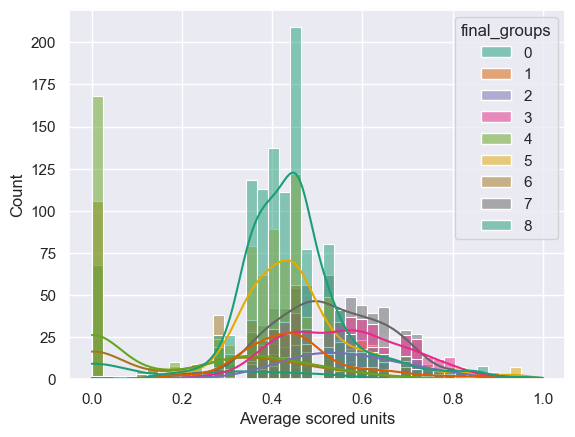

 32%|███▏      | 7/22 [00:03<00:07,  1.96it/s]

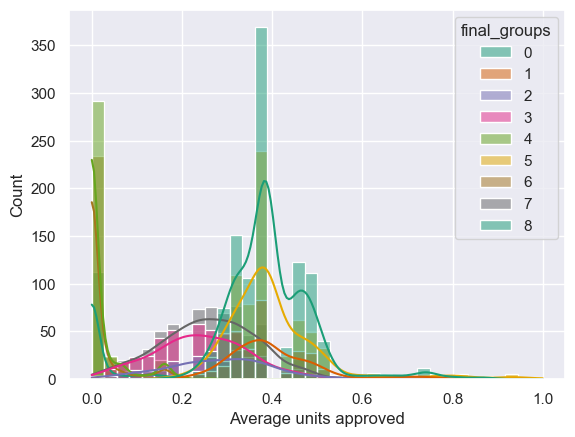

 36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

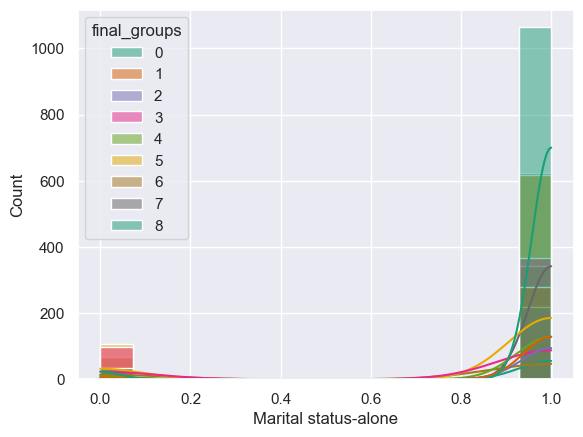

 41%|████      | 9/22 [00:04<00:05,  2.42it/s]

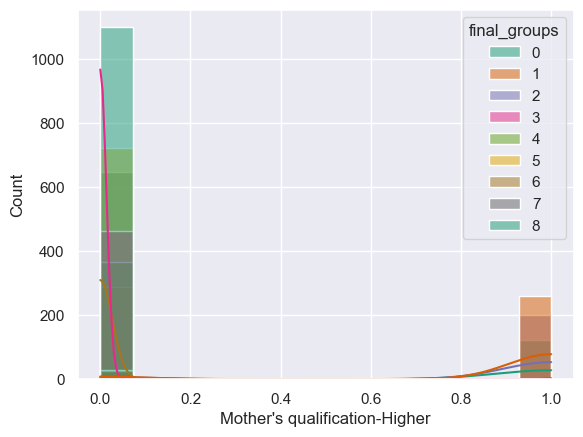

 45%|████▌     | 10/22 [00:04<00:04,  2.78it/s]

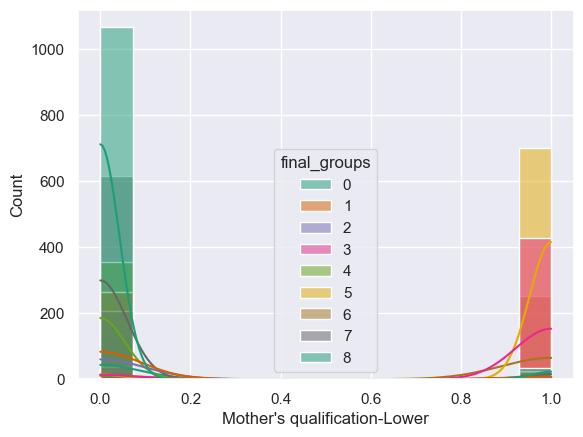

 50%|█████     | 11/22 [00:04<00:03,  3.02it/s]

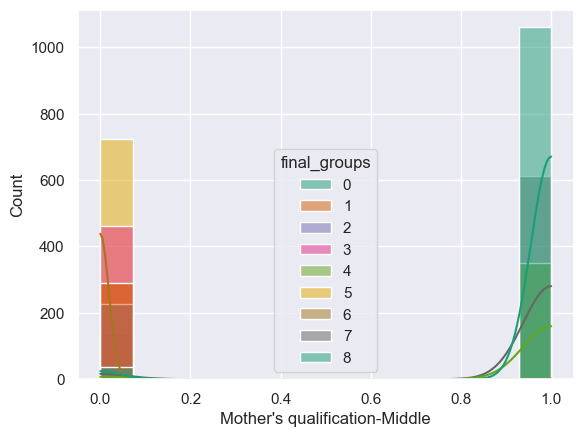

 55%|█████▍    | 12/22 [00:04<00:03,  3.27it/s]

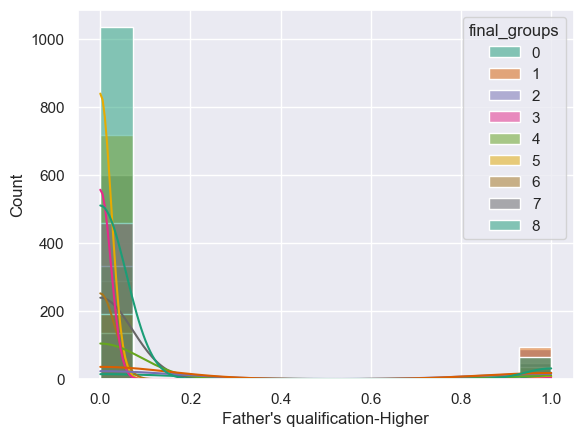

 59%|█████▉    | 13/22 [00:05<00:02,  3.48it/s]

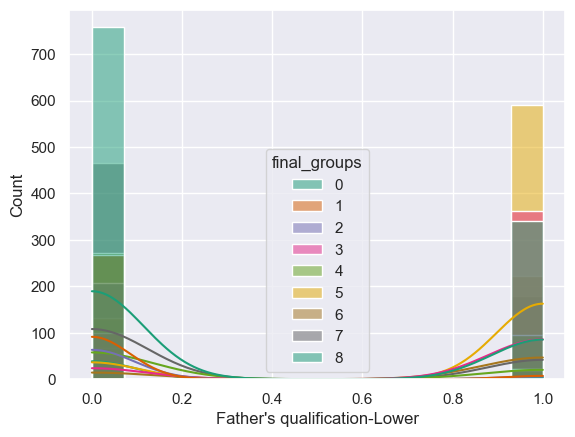

 64%|██████▎   | 14/22 [00:05<00:02,  3.57it/s]

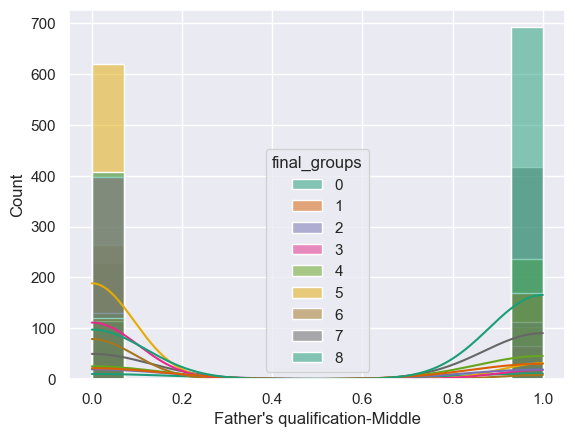

 68%|██████▊   | 15/22 [00:05<00:01,  3.62it/s]

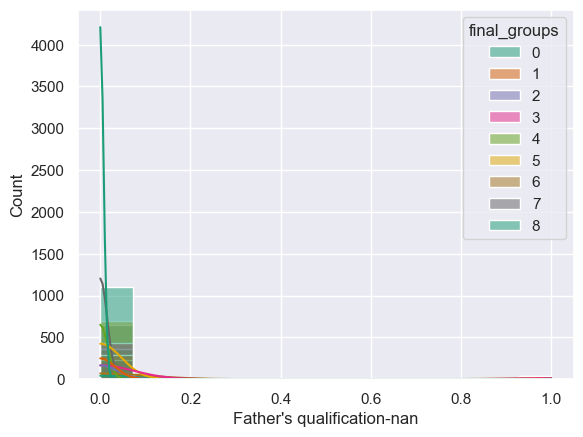

 73%|███████▎  | 16/22 [00:05<00:01,  3.71it/s]

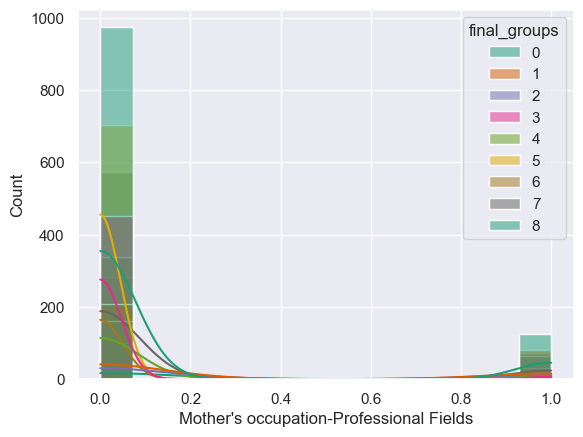

 77%|███████▋  | 17/22 [00:06<00:01,  3.81it/s]

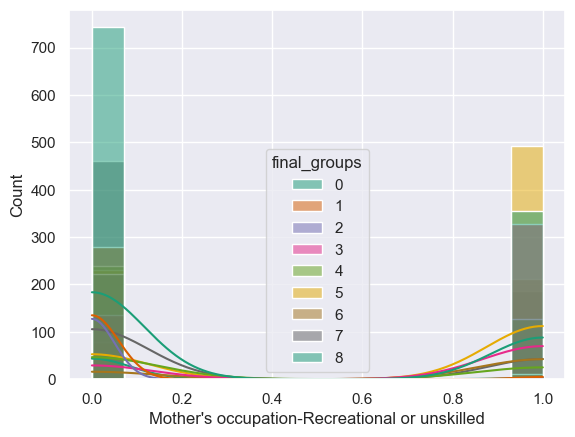

 82%|████████▏ | 18/22 [00:06<00:01,  3.80it/s]

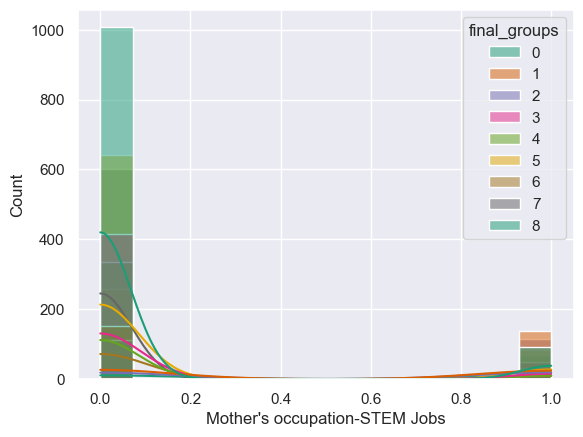

 86%|████████▋ | 19/22 [00:06<00:00,  3.84it/s]

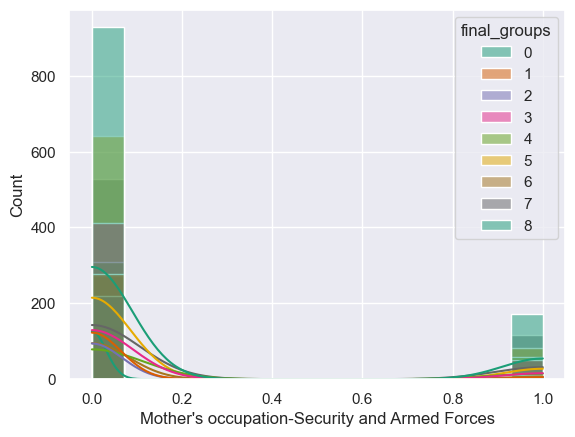

 91%|█████████ | 20/22 [00:07<00:00,  2.79it/s]

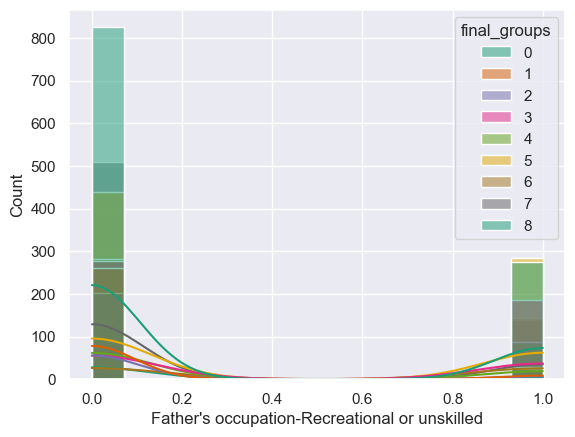

 95%|█████████▌| 21/22 [00:07<00:00,  2.98it/s]

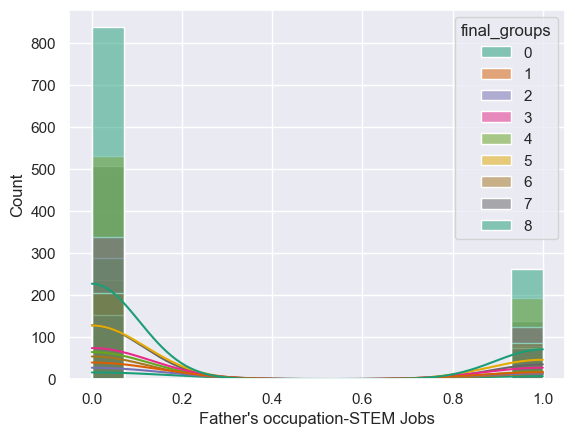

100%|██████████| 22/22 [00:07<00:00,  2.80it/s]


In [88]:
for i in tqdm(profiling_df.drop('final_groups', axis = 1).columns):
    sns.histplot(profiling_df, x = i, hue='final_groups', kde = True, legend = True, palette = 'Dark2')
    plt.show()

In [89]:
profiling_df.groupby(['final_groups']).describe().T

final_groups                                                   0           1  \
Entry score                                   count  1099.000000  289.000000   
                                              mean      0.346578    0.368403   
                                              std       0.137324    0.172286   
                                              min       0.010526    0.041053   
                                              25%       0.259474    0.250526   
                                              50%       0.336842    0.361053   
                                              75%       0.413684    0.450526   
                                              max       1.000000    1.000000   
Gender_Male                                   count  1099.000000  289.000000   
                                              mean      0.224750    0.301038   
                                              std       0.417607    0.459505   
                                              min       0.000000    0.000000   
                                              25%       0.000000    0.000000   
                                              50%       0.000000    0.000000   
                                              75%       0.000000    1.000000   
                                              max       1.000000    1.000000   
Age at enrollment                             count  1099.000000  289.000000   
                                              mean      0.060484    0.072077   
                                              std       0.075642    0.093528   
                                              min       0.000000    0.000000   
                                              25%       0.018868    0.018868   
                                              50%       0.037736    0.037736   
                                              75%       0.056604    0.075472   
                                              max       0.679245    0.849057   
Success                                       count  1099.000000  289.000000   
                                              mean      0.982712    0.968858   
                                              std       0.091394    0.134626   
                                              min       0.500000    0.000000   
                                              25%       1.000000    1.000000   
                                              50%       1.000000    1.000000   
                                              75%       1.000000    1.000000   
                                              max       1.000000    1.000000   
Average grades                                count  1099.000000  289.000000   
                                              mean      0.717545    0.731352   
                                              std       0.065685    0.080063   
                                              min       0.000000    0.000000   
                                              25%       0.674555    0.683671   
                                              50%       0.714664    0.727426   
                                              75%       0.761372    0.777431   
                                              max       0.981881    1.000000   
Average units taken                           count  1099.000000  289.000000   
                                              mean      0.456363    0.466139   
                                              std       0.110768    0.128089   
                                              min       0.000000    0.142857   
                                              25%       0.371429    0.371429   
                                              50%       0.457143    0.457143   
                                              75%       0.485714    0.514286   
                                              max       1.000000    0.971429   
Average scored units                          count  1099.000000  289.000000   
